# **Chapter 10**

# **Image Segmentation: From Classical Methods to Deep Learning**

---

Image segmentation is one of the most fundamental and transformative problems in computer vision. While image classification assigns a single label to an entire image and object detection localizes objects with bounding boxes, segmentation operates at the pixel level — partitioning an image into meaningful and coherent regions.

Formally, given an image $I : \Omega \subset \mathbb{R}^2 \to \mathbb{R}^c$, segmentation seeks a partition:

$$\Omega = \bigcup_{k=1}^{K} R_k, \quad R_i \cap R_j = \emptyset$$

where each region $R_k$ corresponds to a semantically or structurally meaningful entity.

Segmentation techniques have evolved dramatically:

* Early approaches relied on **intensity statistics, gradients, morphology, and variational calculus**.
* Modern approaches leverage **convolutional neural networks, transformers, diffusion models, and foundation models**.

This chapter is divided into two major parts:

* **Part I:** Classical Image Segmentation
* **Part II:** Deep Learning Based Segmentation

Together, they provide a unified theoretical and practical treatment.

---

## **Part I — Classical Image Segmentation**

Classical segmentation methods rely on explicit mathematical modeling of:

* Intensity distributions
* Spatial continuity
* Edge information
* Region homogeneity
* Energy minimization principles

These approaches are interpretable, computationally efficient, and form the theoretical backbone of modern deep learning models. We group the topics into five conceptual blocks:

### **1. Threshold-Based Segmentation**

#### **1.1 Multi-Otsu Thresholding**

Thresholding partitions intensity space into multiple classes: $\sigma^2_{between} = \sum\limits_{i=1}^{K} \omega_i (\mu_i - \mu_T)^2$
Multi-Otsu extends binary thresholding to $K$-class segmentation.

The multi-Otsu threshold [1] is a thresholding algorithm that is used to separate the pixels of an input image into several different classes, each one obtained according to the intensity of the gray levels within the image.

Multi-Otsu calculates several thresholds, determined by the number of desired classes. The default number of classes is 3: for obtaining three classes, the algorithm returns two threshold values. They are represented by a red line in the histogram below.

Applications:

* Document segmentation
* Medical image tissue separation
* Satellite imagery

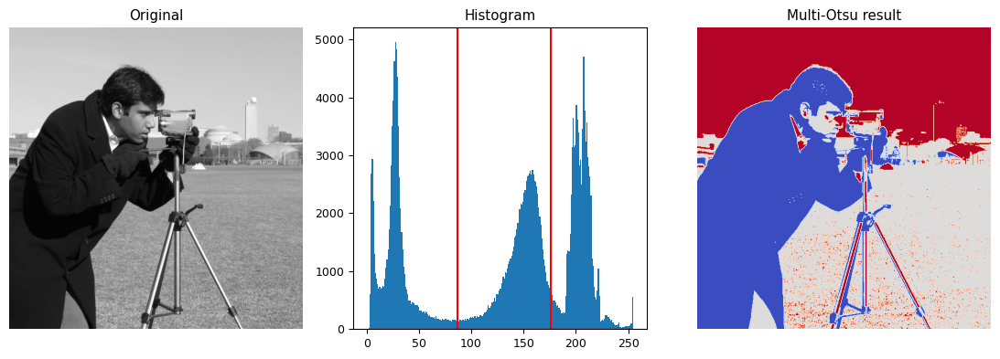

In [4]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from skimage import data
from skimage.filters import threshold_multiotsu

# Setting the font size for all plots.
matplotlib.rcParams['font.size'] = 9

# The input image.
image = data.camera()

# Applying multi-Otsu threshold for the default value, generating three classes.
thresholds = threshold_multiotsu(image)

# Using the threshold values, we generate the three regions.
regions = np.digitize(image, bins=thresholds)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(11, 4))

# Plotting the original image.
ax[0].imshow(image, cmap='gray', aspect='auto')
ax[0].set_title('Original')
ax[0].axis('off')

# Plotting the histogram and the two thresholds obtained from multi-Otsu.
ax[1].hist(image.ravel(), bins=255)
ax[1].set_title('Histogram')
for thresh in thresholds:
    ax[1].axvline(thresh, color='r')

# Plotting the Multi Otsu result.
ax[2].imshow(regions, cmap='coolwarm', aspect='auto')
ax[2].set_title('Multi-Otsu result')
ax[2].axis('off')

plt.tight_layout()
plt.show()

### **2. Edge, Region, and Topographic Segmentation**

#### **2.1 Watershed Segmentation**

Watershed treats the gradient image as a topographic surface and segments via flooding from markers:

$L = \text{Watershed}(\nabla I, \text{markers})$

Used for:

* Cell separation
* Coin counting
* Touching object segmentation


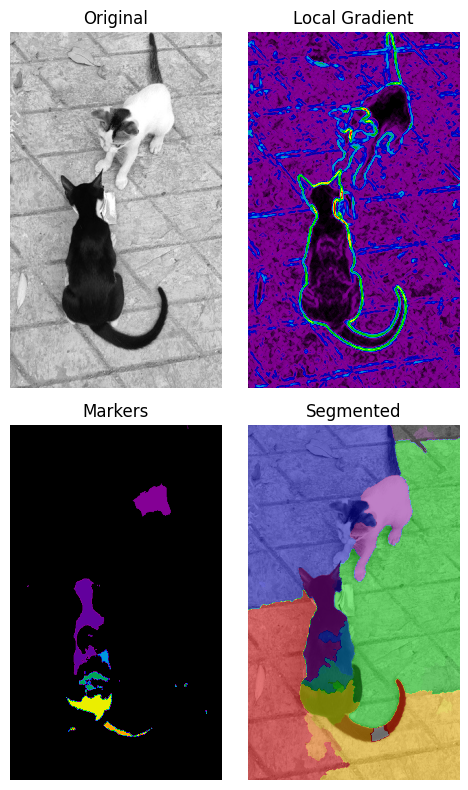

In [9]:
from scipy import ndimage as ndi
import matplotlib.pyplot as plt

from skimage.morphology import disk
from skimage.segmentation import watershed
from skimage import data
from skimage.filters import rank
from skimage.util import img_as_ubyte
from skimage.io import imread
from skimage.color import rgb2gray

image = rgb2gray(imread('images/cats.jpg')) #img_as_ubyte(data.eagle())

# denoise image
denoised = rank.median(image, disk(2))

# find continuous region (low gradient -
# where less than 10 for this image) --> markers
# disk(5) is used here to get a more smooth image
markers = rank.gradient(denoised, disk(5)) < 10
markers = ndi.label(markers)[0]

# local gradient (disk(2) is used to keep edges thin)
gradient = rank.gradient(denoised, disk(2))

# process the watershed
labels = watershed(gradient, markers)

# display results
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(5, 8), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title("Original")

ax[1].imshow(gradient, cmap=plt.cm.nipy_spectral)
ax[1].set_title("Local Gradient")

ax[2].imshow(markers, cmap=plt.cm.nipy_spectral)
ax[2].set_title("Markers")

ax[3].imshow(image, cmap=plt.cm.gray)
ax[3].imshow(labels, cmap=plt.cm.nipy_spectral, alpha=0.5)
ax[3].set_title("Segmented")

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

#### **2.2 Counting Coins with Segmentation and Morphology**

Pipeline:

1. Thresholding
2. Morphological cleaning
3. Distance transform
4. Watershed separation
5. Connected component labeling

Demonstrates practical morphological segmentation.

#### **Counting Coins with Segmentation and Morphology**

Counting objects in an image is a fundamental task in computer vision, often applied in **industrial inspection, medical imaging, and robotics**. In this section, we focus on **counting coins** in an image using **image segmentation and morphological operations**.

Given a grayscale or RGB image $I(x,y)$ containing multiple coins, we want to determine the **number of individual coins** $N_c$.

This can be formalized as:

1. **Segmentation**: Separate foreground (coins) from background.
2. **Morphological Processing**: Refine segmentation, separate touching coins.
3. **Labeling**: Assign a unique label to each connected coin.
4. **Counting**: Compute the number of unique labels.

**Image Segmentation**

A **segmentation mask** $M(x,y)$ is a binary image where:

$$M(x,y) =
\begin{cases}
1, & \text{if pixel belongs to a coin} \
0, & \text{if pixel belongs to background}
\end{cases}
$$

**Thresholding** is a common method to obtain (M) from a grayscale image $I$:

$$M(x,y) =
\begin{cases}
1, & I(x,y) > T \
0, & I(x,y) \le T
\end{cases}$$

Where $T$ is a threshold value, which can be **global** or **adaptive**.

**Morphological Operations**

Morphological operations help **clean the binary mask** and **separate touching coins**.

1. **Erosion** $(\ominus)$: $B \ominus S = { z \mid S_z \subseteq B }$

* Removes small noise pixels
* Shrinks objects

2. **Dilation** $(\oplus)$: $B \oplus S = { z \mid S_z \cap B \neq \emptyset }$

* Expands objects
* Connects nearby pixels

3. **Opening** $(\circ)$: $B \circ S = (B \ominus S) \oplus S$

* Removes small objects/noise
* Smooths boundaries

4. **Closing** $(\bullet)$: $B \bullet S = (B \oplus S) \ominus S$

* Fills small holes inside objects

5. **Distance Transform & Watershed**: For separating touching coins:

* Compute distance transform (D(x,y)) of binary mask
* Peaks correspond to coin centers
* Apply **watershed algorithm** to split overlapping objects

**Labeling and Counting**

After segmentation and morphological refinement, the binary mask contains **connected components**. Label each component: $L = \text{label}(M)$.

The **number of coins** is: $N_c = \max(L)$

#### **Python Demonstration**

Let's implement coin counting on a synthetic or real coin image using **`skimage`**.

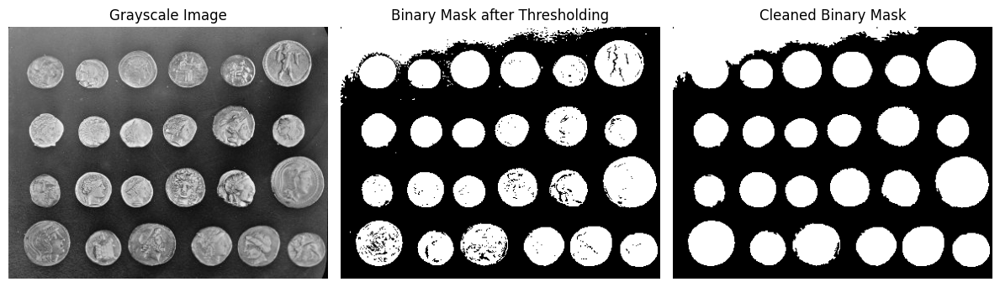

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, measure, morphology
from scipy import ndimage as ndi
from skimage import data

# Load image
gray = data.coins()

# Otsu's thresholding
thresh = filters.threshold_otsu(gray)
binary = gray > thresh

### Morphological Cleaning
# Remove small objects
cleaned = morphology.remove_small_objects(binary, min_size=100)
# Fill small holes
cleaned = ndi.binary_fill_holes(cleaned)

plt.figure(figsize=(12,6))
plt.gray()
plt.subplot(131), plt.imshow(gray), plt.title("Grayscale Image"), plt.axis('off')
plt.subplot(132), plt.imshow(binary), plt.title("Binary Mask after Thresholding"), plt.axis('off')
plt.subplot(133), plt.imshow(cleaned), plt.title("Cleaned Binary Mask"), plt.axis('off')
plt.tight_layout()
plt.show()

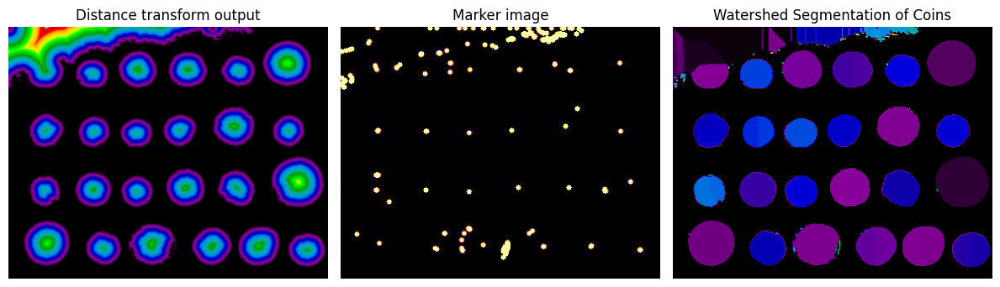

In [29]:
### Distance Transform and Watershed

from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from scipy import ndimage as ndi
from skimage import measure

# Compute distance transform
distance = ndi.distance_transform_edt(cleaned)

# Find local maxima coordinates
coords = peak_local_max(
    distance,
    footprint=np.ones((3, 3)),
    labels=cleaned
)

# Create marker image
markers = np.zeros_like(distance, dtype=int)

for i, (r, c) in enumerate(coords, start=1):
    markers[r, c] = i

# Apply watershed
labels = watershed(-distance, markers, mask=cleaned)

plt.figure(figsize=(12,6))
plt.subplot(131), plt.imshow(distance, cmap='nipy_spectral'), plt.title("Distance transform output"), plt.axis('off')
plt.subplot(132), plt.imshow(morphology.dilation(markers > 0, morphology.disk(3)), cmap='inferno'), plt.title("Marker image"), plt.axis('off')
plt.subplot(133), plt.imshow(labels, cmap='nipy_spectral'), plt.title("Watershed Segmentation of Coins"), plt.axis('off')
plt.tight_layout()
plt.show()

Number of coins detected: 24


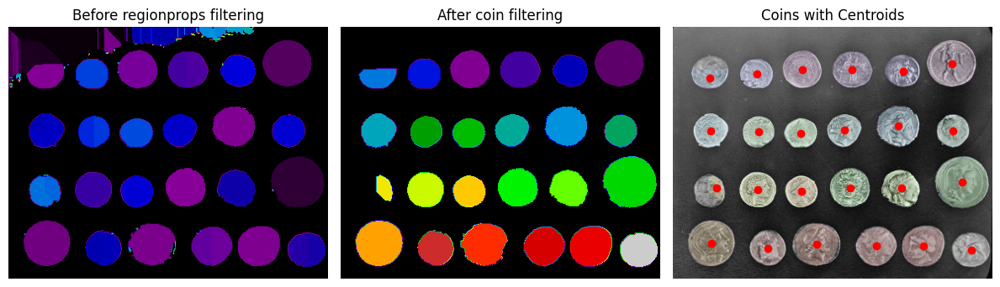

In [39]:
MIN_AREA = 200
MAX_AREA = 5000
MAX_ECCENTRICITY = 0.75     # 0 = circle, 1 = line
MIN_SOLIDITY = 0.85
MIN_EXTENT = 0.6

regions = measure.regionprops(labels)
coin_labels = []

for region in regions:
    circularity = 4 * np.pi * region.area / (region.perimeter ** 2 + 1e-6)

    if circularity > 0.7 and region.area > MIN_AREA:
        coin_labels.append(region.label)

coin_mask = np.isin(labels, coin_labels)
clean_labels = measure.label(coin_mask)
num_coins = clean_labels.max()
print(f"Number of coins detected: {num_coins}")

regions = measure.regionprops(clean_labels)

plt.figure(figsize=(12,5))
plt.subplot(131), plt.imshow(labels, cmap='nipy_spectral'), plt.title("Before regionprops filtering"), plt.axis('off')
plt.subplot(132), plt.imshow(clean_labels, cmap='nipy_spectral'), plt.title("After coin filtering"), plt.axis('off')
plt.subplot(133), plt.imshow(gray, cmap='gray'), plt.imshow(clean_labels, cmap='nipy_spectral', alpha=0.1)
for region in regions:
    y, x = region.centroid
    plt.plot(x, y, 'ro')  # Red dot at centroid
plt.title("Coins with Centroids"), plt.axis('off')
plt.tight_layout()
plt.show()

* **Thresholding** separates foreground (coins) from background.
* **Morphological operations** (opening, closing, distance transform, watershed) clean the mask and separate overlapping coins.
* **Connected-component labeling** (`skimage.measure.label`) identifies each coin.
* **Counting** is simply the number of labeled regions.
* This pipeline is robust and extendable to **cells, bubbles, fruits, and other circular objects**.

This approach demonstrates how **mathematical morphology and segmentation** can be used effectively for practical counting problems in computer vision.

### **3. Superpixel-Based Segmentation**

#### **3.1 SLIC vs MaskSLIC**

Superpixel segmentation clusters pixels in a 5D space: $(x, y, L, a, b)$
SLIC performs localized k-means clustering.
MaskSLIC improves boundary adherence by respecting masks.

Applications:

* Preprocessing for deep networks
* Efficient region representation


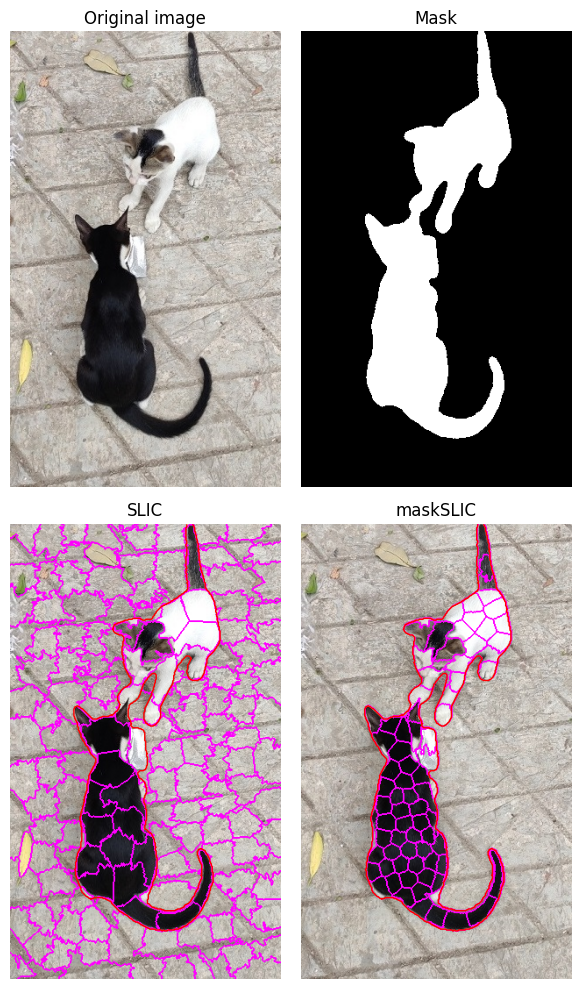

In [68]:
import matplotlib.pyplot as plt

from skimage import data
from skimage import color
from skimage import morphology
from skimage import segmentation

# Input data
img = plt.imread('images/cats.jpg') #data.immunohistochemistry()
#img = img / img.max()

# Compute a mask
lum = color.rgb2gray(img)
mask = color.rgb2gray(plt.imread('images/cat_mask.jpg')) > 0.1 #lum < 0.15
mask = morphology.remove_small_objects(mask, min_size=499)
mask = morphology.remove_small_holes(mask, area_threshold =499)
mask = morphology.opening(mask, morphology.disk(3))

# SLIC result
slic = segmentation.slic(img, n_segments=200, start_label=1)

# maskSLIC result
m_slic = segmentation.slic(img, n_segments=100, mask=mask, start_label=1)

# Display result
fig, ax_arr = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(6, 10))
ax1, ax2, ax3, ax4 = ax_arr.ravel()

ax1.imshow(img)
ax1.set_title('Original image')

ax2.imshow(mask, cmap='gray')
ax2.set_title('Mask')

ax3.imshow(segmentation.mark_boundaries(img, slic, color=(1,0,1)))
ax3.contour(mask, colors='red', linewidths=1)
ax3.set_title('SLIC')

ax4.imshow(segmentation.mark_boundaries(img, m_slic, color=(1,0,1)))
ax4.contour(mask, colors='red', linewidths=1)
ax4.set_title('maskSLIC')

for ax in ax_arr.ravel():
    ax.set_axis_off()

plt.tight_layout()
plt.show()

#### **3.2 Segmentation vs Superpixelation**

Segmentation → semantic grouping
Superpixelation → oversegmentation for efficiency

Felzenszwalb number of segments: 133
SLIC number of segments: 216
Quickshift number of segments: 172
Watershed number of segments: 240


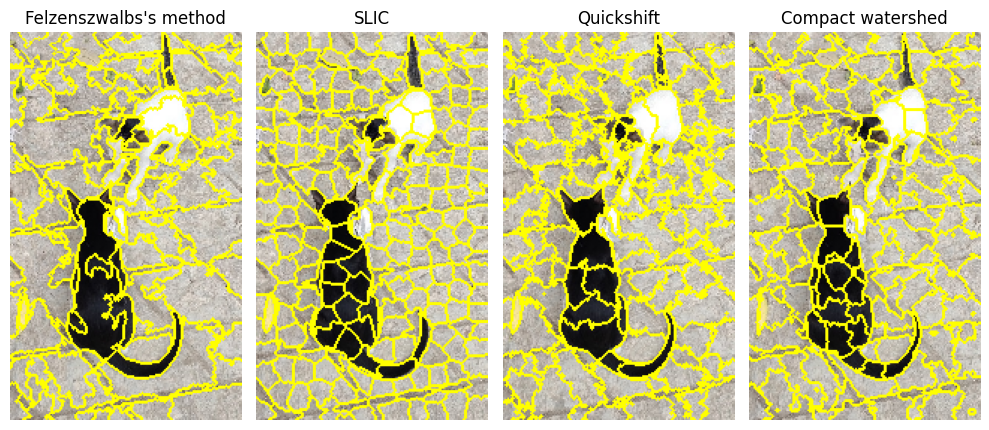

In [70]:
import matplotlib.pyplot as plt
import numpy as np

from skimage.data import astronaut
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float

img = img_as_float(plt.imread('images/cats.jpg')[::2, ::2]) #img_as_float(astronaut()[::2, ::2])

segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=50)
segments_slic = slic(img, n_segments=250, compactness=10, sigma=1, start_label=1)
segments_quick = quickshift(img, kernel_size=3, max_dist=6, ratio=0.5)
gradient = sobel(rgb2gray(img))
segments_watershed = watershed(gradient, markers=250, compactness=0.001)

print(f'Felzenszwalb number of segments: {len(np.unique(segments_fz))}')
print(f'SLIC number of segments: {len(np.unique(segments_slic))}')
print(f'Quickshift number of segments: {len(np.unique(segments_quick))}')
print(f'Watershed number of segments: {len(np.unique(segments_watershed))}')

fig, ax = plt.subplots(1, 4, figsize=(10, 12), sharex=True, sharey=True)

ax[0].imshow(mark_boundaries(img, segments_fz))
ax[0].set_title("Felzenszwalbs's method")
ax[1].imshow(mark_boundaries(img, segments_slic))
ax[1].set_title('SLIC')
ax[2].imshow(mark_boundaries(img, segments_quick))
ax[2].set_title('Quickshift')
ax[3].imshow(mark_boundaries(img, segments_watershed))
ax[3].set_title('Compact watershed')

for a in ax.ravel():
    a.set_axis_off()

plt.tight_layout()
plt.show()

### **4. Variational and Energy-Based Segmentation**

These methods formulate segmentation as energy minimization:

$E = E_{data} + \lambda E_{regularization}$

#### **4.1 Chan–Vese Active Contours**

Minimizes:

$$E(c_1,c_2,C) = \mu \cdot Length(C) + \lambda_1 \int\limits_{inside} |I-c_1|^2 + \lambda_2 \int\limits_{outside} |I-c_2|^2$$

Region-based segmentation without relying on edges.


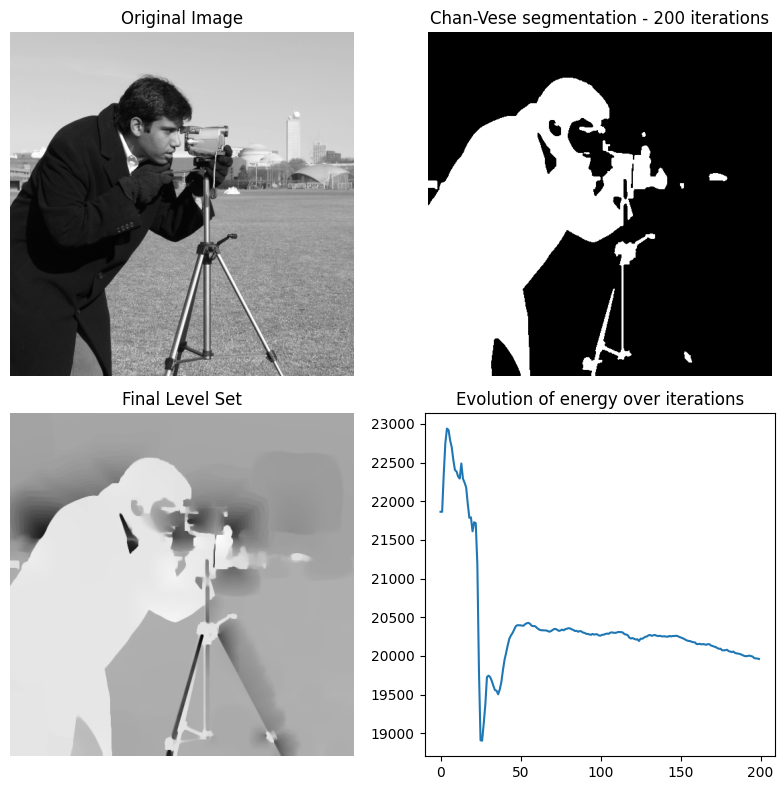

In [72]:
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.segmentation import chan_vese

image = img_as_float(data.camera())
# Feel free to play around with the parameters to see how they impact the result
cv = chan_vese(
    image,
    mu=0.25,
    lambda1=1,
    lambda2=1,
    tol=1e-3,
    max_num_iter=200,
    dt=0.5,
    init_level_set="checkerboard",
    extended_output=True,
)

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
ax = axes.flatten()

ax[0].imshow(image, cmap="gray")
ax[0].set_axis_off()
ax[0].set_title("Original Image", fontsize=12)

ax[1].imshow(cv[0], cmap="gray")
ax[1].set_axis_off()
title = f'Chan-Vese segmentation - {len(cv[2])} iterations'
ax[1].set_title(title, fontsize=12)

ax[2].imshow(cv[1], cmap="gray")
ax[2].set_axis_off()
ax[2].set_title("Final Level Set", fontsize=12)

ax[3].plot(cv[2])
ax[3].set_title("Evolution of energy over iterations", fontsize=12)

fig.tight_layout()
plt.show()

#### **4.2 Mumford–Shah Functional**

$$E(u, \Gamma) = \int_{\Omega} |I-u|^2 dx + \lambda \int_{\Omega \setminus \Gamma} |\nabla u|^2 dx + \nu |\Gamma|$$

Foundational variational segmentation framework.

![](images/ms_at.png)

In [131]:
#Jacob Gildenblat, 2015
#Implementation of edge preserving smoothing by minimizing with the Ambrosio-Tortorelli appoach
#AM scheme, using conjugate gradients

class AmbrosioTortorelliMinimizer():
    def __init__(self, img, iterations = 1, solver_maxiterations = 10, tol = 0.1, alpha = 1000, beta = 0.01, epsilon = 0.01):
        self.iterations = iterations
        self.tol = tol
        self.g = np.float64(img) / np.max(img)
        self.f = self.g
        self.edges = np.zeros(img.shape)
        self.update_gradients()		
        self.alpha, self.beta, self.epsilon = alpha, beta, epsilon
        self.add_const = self.beta / (4 * self.epsilon)
        self.multiply_const = self.epsilon * self.beta
        self.maxiter = solver_maxiterations

    def update_gradients(self):
        self.grad_x, self.grad_y = self.gradients(self.f)
        self.gradient_mag = np.power(self.grad_x, 2) + np.power(self.grad_y, 2)

    def edge_linear_operator(self, input):
        v = input.reshape(*self.g.shape)
        # ∇2v −2α|∇u|2v/ρ −(v − 1)/ρ2
        result = np.multiply(v, self.gradient_mag * self.alpha + self.add_const) \
                - self.multiply_const* cv2.Laplacian(v, cv2.CV_64F)

        return result.reshape(*input.shape)

    def image_linear_operator(self, input):
        f = input.reshape(*self.g.shape)

        x, y = self.gradients(f)
        # ∇ · (v2∇u) − β/α (u − f)
        result = f - 2*self.alpha * (self.calc_grad_x(np.multiply(self.edges, x)) + \
                                     self.calc_grad_y(np.multiply(self.edges, y)) )
        return result.reshape(*input.shape)

    def solve_edges(self):
        size = self.g.shape[0]* self.g.shape[1]
        A = LinearOperator( (size, size), matvec = self.edge_linear_operator, dtype = np.float64)
        b = np.ones(size) * self.beta / (4 * self.epsilon)

        self.edges, _ = scipy.sparse.linalg.cg(A, b, tol = self.tol, maxiter = self.maxiter)
        self.edges = np.power(self.edges.reshape(*self.g.shape), 2)
        return self.edges

    def solve_image(self):
        size = self.g.shape[0]* self.g.shape[1]
        A = LinearOperator( (size, size), matvec = self.image_linear_operator, dtype = np.float64)
        b = self.g.reshape(size)

        self.f, _ = scipy.sparse.linalg.cg(A, b, tol = self.tol, maxiter = self.maxiter)
        self.f = self.f.reshape(*self.g.shape)
        self.update_gradients()
        return self.f

    def minimize(self):
        for i in range(0, self.iterations):
            self.solve_edges()
            self.solve_image()

        self.edges = np.power(self.edges, 0.5)
        cv2.normalize(self.f, self.f ,0,255,cv2.NORM_MINMAX)
        cv2.normalize(self.edges, self.edges ,0,255,cv2.NORM_MINMAX)
        self.f = np.uint8(self.f)
        self.edges = 255 - np.uint8(self.edges)

        return self.f, self.edges

    def calc_grad_x(self, img):
        return cv2.filter2D(img, cv2.CV_64F, np.array([[-1, 0, 1]]))

    def calc_grad_y(self, img):
        return cv2.filter2D(img, cv2.CV_64F, np.array([[-1, 0, 1]]).T)

    def gradients(self, img):
        return self.calc_grad_x(img), self.calc_grad_y(img)

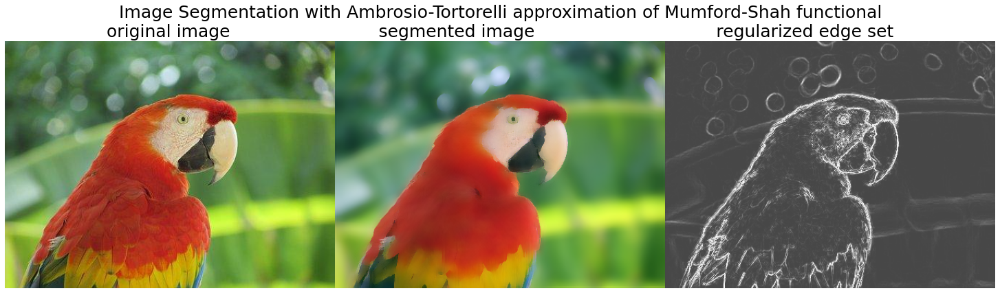

In [140]:
f = plt.imread('images/parrot.jpg')
#f = f / f.max()

result, edges = [], []
for channel in cv2.split(f):
    solver = AmbrosioTortorelliMinimizer(channel, iterations = 1, tol = 0.1, solver_maxiterations = 6)
    u, v = solver.minimize()
    result.append(u)
    edges.append(v)

u = cv2.merge(result)
v = np.maximum(*edges)
v = gray2rgb(v)

plt.figure(figsize=(20,9))
plt.gray()
plt.subplots_adjust(0,0,1,0.8,0.05,0.05)
plt.imshow(np.hstack((f, u, v))), plt.axis('off')
plt.title('Image Segmentation with Ambrosio-Tortorelli approximation of Mumford-Shah functional\n' +
         'original image \N{TaB} \N{TaB} \N{TaB} \N{TaB} segmented image \N{TaB} \N{TaB} \N{TaB} \N{TaB} regularized edge set'.expandtabs(), 
          size=25)
plt.show()

### **5. Graphical and Probabilistic Methods**

#### **5.1 GrabCut**

Energy minimization using graph cuts:

$$E = \sum D_p(f_p) + \sum V_{pq}(f_p, f_q)$$

Interactive foreground extraction.

#### **GrabCut with OpenCV**

GrabCut is an interactive segmentation method that extracts the foreground from the
background in an image using the graph-theoretic max-flow/min-cut algorithm. Before the
algorithm can start, the user first needs to provide some hint by specifying the foreground
region in the input image roughly with minimum possible interaction (for example, by
drawing a rectangle around the foreground region). The algorithm then segments the
image iteratively to get the best possible result. In some cases, the segmentation may not be
the desired one (for example, the algorithm may have marked some foreground region as
background and vice versa).

In that case, the user needs to do fine touch-ups again by giving some strokes on the images
(by marking some more pixels as foreground or background) where there are some
wrongly segmented pixels. This results in better segmentation in the next iteration.
The next code snippet demonstrates how the foreground whale object can be extracted
from the input image by just drawing a rectangle around the whale (by providing a hint to
the algorithm that the foreground object needs to be found inside the rectangle) and calling
the grabCut() function from `cv2` on the input image. The mask image is an image through
which we can specify which regions in the image are surely background, surely
foreground, or probable background/foreground, using the following flags, $0$
(`cv2.GC_BGD`), $1$ (`cv2.GC_FGD)`, $2$ (`cv2.GC_PR_BGD`), $3$ (`cv2.GC_PR_FGD`). 

Since in this case a rectangle is used (instead of the mask) to indicate the foreground, the mode parameter to
the `cv2.grabCut()` function needs to be `cv2.GC_INIT_WITH_RECT`, and the mask image
is set to zeros, initially. The algorithm is run for five iterations, and it modifies the mask
image where the pixels are marked with four flag values denoting background/foreground.
Next, we modify the mask so that all $0$/$2$ valued pixels are set to 0 (background) and all $1$/$3$
valued pixels are set to $1$ (foreground); after this, we obtain the final mask that we need to
multiply with the input image to obtain the segmented image.

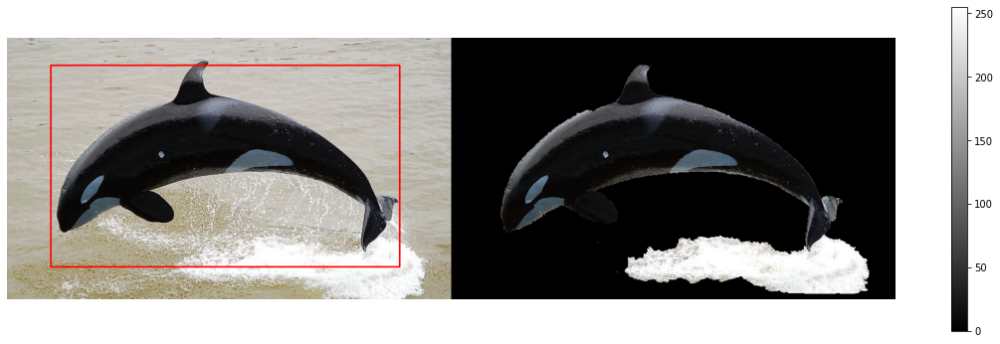

In [115]:
img_orig = cv2.imread('images/whale.jpg')
img = img_orig.copy()
mask = np.zeros(img.shape[:2],np.uint8)
bg_model = np.zeros((1,65),np.float64)
fg_model = np.zeros((1,65),np.float64)
rect = (80,50,720,420)
cv2.grabCut(img, mask, rect, bg_model, fg_model, 5, cv2.GC_INIT_WITH_RECT)
mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
cv2.rectangle(img_orig, rect[:2], rect[-2:], (255,0,0), 2)
img = img*mask2[:,:,np.newaxis]
plt.figure(figsize=(20,6))
plt.imshow(np.hstack((img_orig, img))), plt.axis('off'), plt.colorbar()
plt.show()

The above figure shows the input image along with the bounding box rectangle drawn around the foreground object and the segmented object using the GrabCut algorithm, by running the above code snippet. Notice that the rectangle misses a small part of the fin of the whale at the top and includes a part of the white ocean foam at the bottom of the image. 

The output also shows the output of the code block. As can be seen, a part of the upper fin is missed out and the white foam at the bottom is included as part of the foreground object since the bounding rectangle was a little incorrect (the entire foreground was not inside the bounding rectangle). This can be corrected by providing the hint
bounding rectangle correctly, which is left as an exercise for you.

Another way to initialize the segmentation is to provide some hint to the algorithm by
inputting a mask. For example, in this case, the mask image is of the same shape as the
whale image. Some green and red strokes are drawn on the mask to provide some hint to
the algorithm that these pixels surely belong to foreground and background pixels,
respectively.

In [124]:
newmask = cv2.imread('images/whale_mask.png')
# whereever it is marked green(sure foreground), change mask=1
# whereever it is marked red (sure background), change mask=0

The next figure shows what the mask looks like when drawn on the input image:

![](images/whale_mask.png)

Now the algorithm needs to be run with this mask. The next code block shows how to run the algorithm with the mask. The following figure shows the output of the code block, the correctly segmented
foreground object with the algorithm, with just the strokes in the mask as hints:

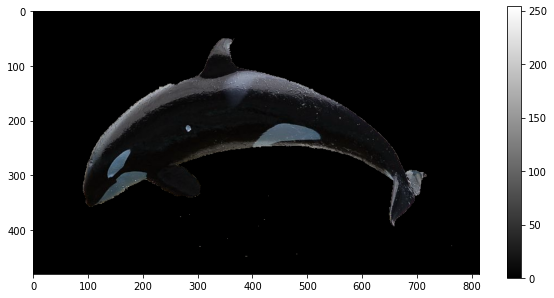

In [126]:
mask = 2*np.ones(img.shape[:2],np.uint8) # initialize all pixels to be probably backgrounds
mask[(newmask[...,0] <= 20)&(newmask[...,1] <= 20)&(newmask[...,2] >= 200)] = 0 # red pixels are backgrounds
mask[(newmask[...,0] <= 20)&(newmask[...,1] >= 200)&(newmask[...,2] <= 20)] = 1 # green pixels are foregrounds
mask, bg_model, fg_model = cv2.grabCut(img,mask,None,bg_model,fg_model,5,cv2.GC_INIT_WITH_MASK)
mask = np.where((mask==2)|(mask==0),0,1).astype('uint8')
img = img*mask[:,:,np.newaxis]
plt.figure(figsize=(10,5))
plt.imshow(img), plt.colorbar()
plt.show()

#### **5.2 Conditional Random Fields (CRF)**

CRF refines segmentation using contextual dependencies:

$$P(Y|X) = \frac{1}{Z(X)} \exp \left( - \sum \psi_u - \sum \psi_p \right)$$

Used for boundary refinement.

Found a full-black pixel in annotation image, assuming it means 'unknown' label, and will thus not be present in the output!
If 0 is an actual label for you, consider writing your own code, or simply giving your labels only non-zero values.
3  labels  plus "unknown" 0:  {0, 1, 2, 3}
Using generic 2D functions
255 255


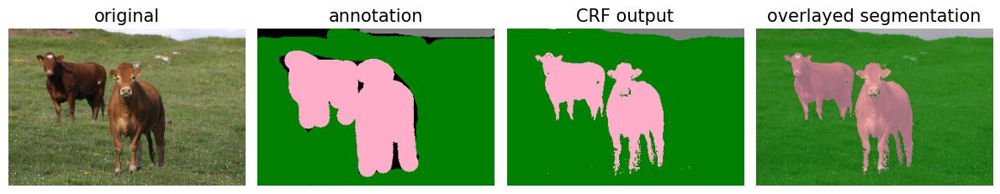

KL-divergence at 0: -420776.6650378704
KL-divergence at 1: -767993.014637647
KL-divergence at 2: -805176.3113676688
KL-divergence at 3: -807013.6780225509
KL-divergence at 4: -807369.9904136674


In [1]:
# conda create -n seg python=3.9 -y
# conda activate seg
# pip install git+https://github.com/lucasb-eyer/pydensecrf.git
import sys
import numpy as np
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_labels, create_pairwise_bilateral, create_pairwise_gaussian
from skimage.io import imread
import matplotlib.pylab as plt

##################################
### Read images and annotation ###
##################################
img = imread('images/cow.png')

# Convert the annotation's RGB color to a single 32-bit integer color 0xBBGGRR
anno_rgb = imread('images/cow_annot.png').astype(np.uint32)
anno_lbl = anno_rgb[:,:,0] + (anno_rgb[:,:,1] << 8) + (anno_rgb[:,:,2] << 16)

# Convert the 32bit integer color to 1, 2, ... labels.
# Note that all-black, i.e. the value 0 for background will stay 0.
colors, labels = np.unique(anno_lbl, return_inverse=True)


# But remove the all-0 black, that won't exist in the MAP!
HAS_UNK = 0 in colors
if HAS_UNK:
    print("Found a full-black pixel in annotation image, assuming it means 'unknown' label, and will thus not be present in the output!")
    print("If 0 is an actual label for you, consider writing your own code, or simply giving your labels only non-zero values.")
    colors = colors[1:]
#else:
#    print("No single full-black pixel found in annotation image. Assuming there's no 'unknown' label!")

# And create a mapping back from the labels to 32bit integer colors.
colorize = np.empty((len(colors), 3), np.uint8)
colorize[:,0] = (colors & 0x0000FF)
colorize[:,1] = (colors & 0x00FF00) >> 8
colorize[:,2] = (colors & 0xFF0000) >> 16


# Compute the number of classes in the label image.
# We subtract one because the number shouldn't include the value 0 which stands
# for "unknown" or "unsure".
n_labels = len(set(labels.flat)) - int(HAS_UNK)
print(n_labels, " labels", (" plus \"unknown\" 0: " if HAS_UNK else ""), set(labels.flat))

###########################
### Setup the CRF model ###
###########################

#use_2d = False
print("Using generic 2D functions")

# Example using the DenseCRF class and the util functions
d = dcrf.DenseCRF(img.shape[1] * img.shape[0], n_labels)

# get unary potentials (neg log probability)
U = unary_from_labels(labels, n_labels, gt_prob=0.7, zero_unsure=HAS_UNK)
d.setUnaryEnergy(U)

# This creates the color-independent features and then add them to the CRF
feats = create_pairwise_gaussian(sdims=(3, 3), shape=img.shape[:2])
d.addPairwiseEnergy(feats, compat=3,
                    kernel=dcrf.DIAG_KERNEL,
                    normalization=dcrf.NORMALIZE_SYMMETRIC)

# This creates the color-dependent features and then add them to the CRF
feats = create_pairwise_bilateral(sdims=(80, 80), schan=(13, 13, 13),
                                  img=img, chdim=2)
d.addPairwiseEnergy(feats, compat=10,
                    kernel=dcrf.DIAG_KERNEL,
                    normalization=dcrf.NORMALIZE_SYMMETRIC)
    
####################################
### Do inference and compute MAP ###
####################################

# Run five inference steps.
Q = d.inference(5)

# Find out the most probable class for each pixel.
MAP = np.argmax(Q, axis=0)

# Convert the MAP (labels) back to the corresponding colors and save the image.
# Note that there is no "unknown" here anymore, no matter what we had at first.
MAP = colorize[MAP,:]
MAP = MAP.reshape(img.shape)
print(MAP.max(), img.max())
plt.figure(figsize=(12,8))
plt.subplot(141), plt.imshow(img), plt.axis('off'), plt.title('original', size=15)
plt.subplot(142), plt.imshow(anno_rgb), plt.axis('off'), plt.title('annotation', size=15)
plt.subplot(143), plt.imshow(MAP), plt.axis('off'), plt.title('CRF output', size=15)
plt.subplot(144), plt.imshow((0.6*MAP + 0.4*img).astype(np.uint8)), plt.axis('off'), plt.title('overlayed segmentation', size=15)
plt.tight_layout()
plt.show()

# Just randomly manually run inference iterations
Q, tmp1, tmp2 = d.startInference()
for i in range(5):
    print("KL-divergence at {}: {}".format(i, d.klDivergence(Q)))
    d.stepInference(Q, tmp1, tmp2)

### **6. Learning-Based Classical Segmentation**

#### **6.1 Segmentation using Classification**

Trainable pixel classifiers:

* Feature extraction
* Random forests
* Pixel-wise prediction

Bridges classical ML and deep learning.

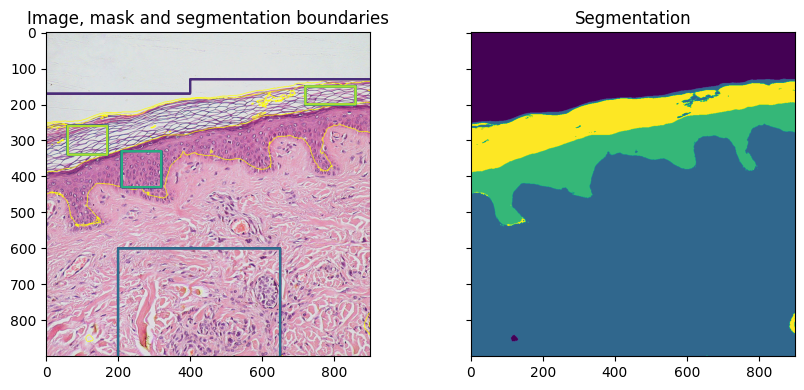

In [82]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, segmentation, feature, future
from sklearn.ensemble import RandomForestClassifier
from functools import partial

full_img = data.skin()

img = full_img[:900, :900]

# Build an array of labels for training the segmentation.
# Here we use rectangles but visualization libraries such as plotly
# (and napari?) can be used to draw a mask on the image.
training_labels = np.zeros(img.shape[:2], dtype=np.uint8)
training_labels[:130] = 1
training_labels[:170, :400] = 1
training_labels[600:900, 200:650] = 2
training_labels[330:430, 210:320] = 3
training_labels[260:340, 60:170] = 4
training_labels[150:200, 720:860] = 4

sigma_min = 1
sigma_max = 16
features_func = partial(
    feature.multiscale_basic_features,
    intensity=True,
    edges=False,
    texture=True,
    sigma_min=sigma_min,
    sigma_max=sigma_max,
    channel_axis=-1,
)
features = features_func(img)
clf = RandomForestClassifier(n_estimators=50, n_jobs=-1, max_depth=10, max_samples=0.05)
clf = future.fit_segmenter(training_labels, features, clf)
result = future.predict_segmenter(features, clf)

fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(9, 4))
ax[0].imshow(segmentation.mark_boundaries(img, result, mode='thick'))
ax[0].contour(training_labels)
ax[0].set_title('Image, mask and segmentation boundaries')
ax[1].imshow(result)
ax[1].set_title('Segmentation')
fig.tight_layout()

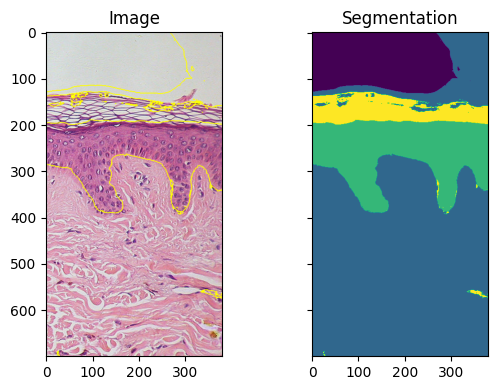

In [83]:
img_new = full_img[:700, 900:]

features_new = features_func(img_new)
result_new = future.predict_segmenter(features_new, clf)
fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(6, 4))
ax[0].imshow(segmentation.mark_boundaries(img_new, result_new, mode='thick'))
ax[0].set_title('Image')
ax[1].imshow(result_new)
ax[1].set_title('Segmentation')
fig.tight_layout()

plt.show()

#### **6.2 Ensemble Segmentation**

Combining segmentations:

$$S = S_1 \cap S_2 \quad \text{or} \quad S_1 \cup S_2$$

Improves robustness.


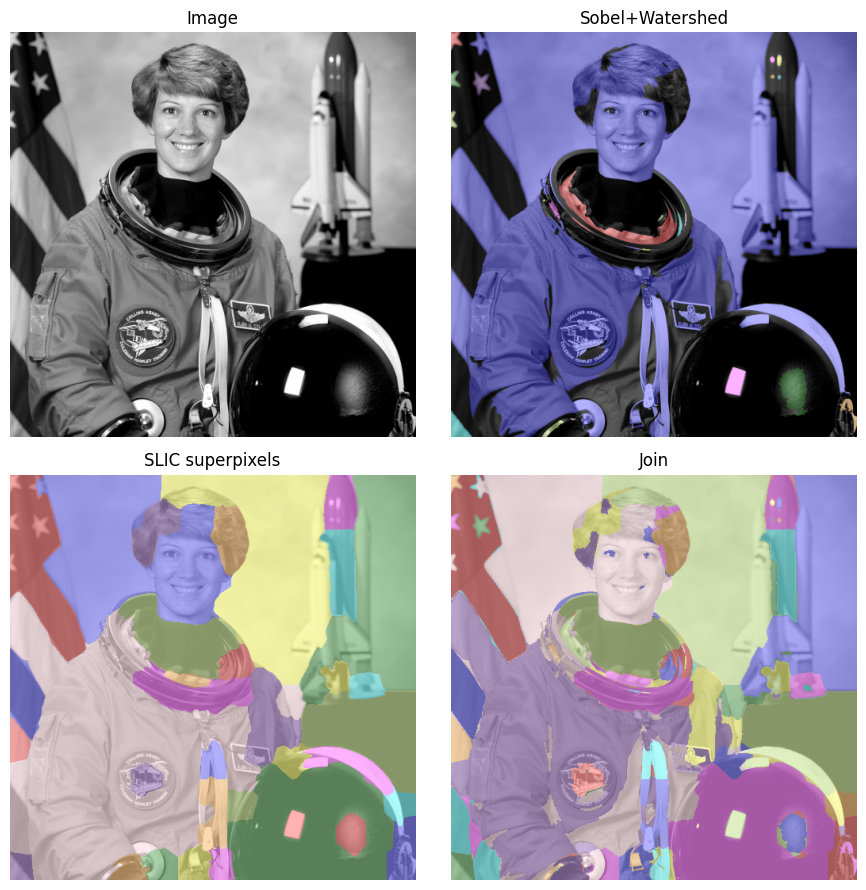

In [65]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.filters import sobel
from skimage.measure import label
from skimage.segmentation import slic, join_segmentations, watershed
from skimage import graph
from skimage.color import label2rgb, rgb2gray
from skimage import data

coins =  (255*rgb2gray(data.astronaut())).astype('uint8') ##data.camera()

# Make segmentation using edge-detection and watershed.
edges = sobel(coins)

# Identify some background and foreground pixels from the intensity values.
# These pixels are used as seeds for watershed.
markers = np.zeros_like(coins)
foreground, background = 1, 2
markers[coins < 30.0] = background
markers[coins > 150.0] = foreground

ws = watershed(edges, markers)
seg1 = label(ws == foreground)

# Make segmentation using SLIC superpixels.
seg2 = slic(
    coins,
    n_segments=200,
    max_num_iter=160,
    sigma=1,
    compactness=0.75,
    channel_axis=None,
    start_label=0,
)
g = graph.rag_mean_color(coins, seg2, mode='similarity')
seg2 = graph.cut_normalized(seg2, g)

# Combine the two.
segj = join_segmentations(seg1, seg2)

# Show the segmentations.
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(9, 9), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(coins, cmap='gray')
ax[0].set_title('Image')

color1 = label2rgb(seg1, image=coins, bg_label=0)
ax[1].imshow(color1)
ax[1].set_title('Sobel+Watershed')

color2 = label2rgb(seg2, image=coins, image_alpha=0.5, bg_label=-1)
ax[2].imshow(color2)
ax[2].set_title('SLIC superpixels')

color3 = label2rgb(segj, image=coins, image_alpha=0.5, bg_label=-1)
ax[3].imshow(color3)
ax[3].set_title('Join')

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

### 7. Region Analysis and Measurement

#### 7.1 Measure Region Properties

Using connected components:

$$\bar{x} = \frac{1}{A} \sum x$$

Extract:

* Area
* Perimeter
* Eccentricity
* Orientation

Crucial for quantitative image analysis.

In [81]:
import plotly
import plotly.express as px
import plotly.graph_objects as go
from skimage import data, filters, measure, morphology

img = data.coins()
# Binary image, post-process the binary mask and compute labels
threshold = filters.threshold_otsu(img)
mask = img > threshold
mask = morphology.remove_small_objects(mask, min_size=49)
mask = morphology.remove_small_holes(mask, area_threshold=49)
labels = measure.label(mask)

fig = px.imshow(img, binary_string=True)
fig.update_traces(hoverinfo='skip')  # hover is only for label info

props = measure.regionprops(labels, img)
properties = ['area', 'eccentricity', 'perimeter', 'intensity_mean']

# For each label, add a filled scatter trace for its contour,
# and display the properties of the label in the hover of this trace.
for index in range(1, labels.max()):
    label_i = props[index].label
    contour = measure.find_contours(labels == label_i, 0.5)[0]
    y, x = contour.T
    hoverinfo = ''
    for prop_name in properties:
        hoverinfo += f'<b>{prop_name}: {getattr(props[index], prop_name):.2f}</b><br>'
    fig.add_trace(
        go.Scatter(
            x=x,
            y=y,
            name=label_i,
            mode='lines',
            fill='toself',
            showlegend=False,
            hovertemplate=hoverinfo,
            hoveron='points+fills',
        )
    )

plotly.io.show(fig)

## **Part II — Deep Learning for Image Segmentation**

Deep learning transforms segmentation into a dense prediction problem: $F_\theta : I \rightarrow Y$
where $Y$ is a pixel-wise label map.

We consider three paradigms:

* Semantic segmentation
* Instance segmentation
* Panoptic segmentation


### **1. Semantic Segmentation with CNNs**

#### **1.1 Fully Convolutional Networks (FCN)**

Removes fully connected layers; outputs dense maps.

Pretrained:

* `fcn_resnet50`
* `FCN_ResNet50_Weights`


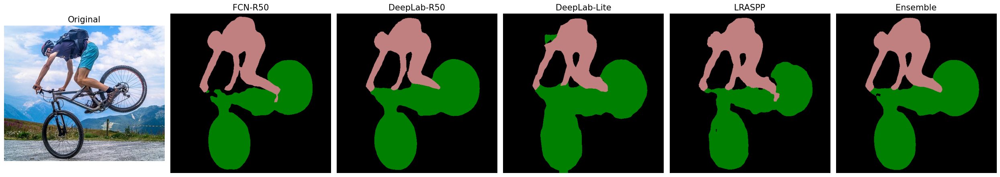

In [27]:
import torch
import torch.nn.functional as F
from torchvision.models.segmentation import (
    fcn_resnet50, FCN_ResNet50_Weights,
    deeplabv3_resnet50, DeepLabV3_ResNet50_Weights,
    deeplabv3_mobilenet_v3_large, DeepLabV3_MobileNet_V3_Large_Weights,
    lraspp_mobilenet_v3_large, LRASPP_MobileNet_V3_Large_Weights
)
import cv2
import numpy as np
import matplotlib.pyplot as plt

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# ---------------------------------------------------
# 1️⃣ Load FULLY Pre-trained Torchvision Models
# ---------------------------------------------------
# These models have both encoder AND decoder pre-trained on COCO/VOC.
models_dict = {
    "FCN-R50": fcn_resnet50(weights=FCN_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1),
    "DeepLab-R50": deeplabv3_resnet50(weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1),
    "DeepLab-Lite": deeplabv3_mobilenet_v3_large(weights=DeepLabV3_MobileNet_V3_Large_Weights.COCO_WITH_VOC_LABELS_V1),
    "LRASPP": lraspp_mobilenet_v3_large(weights=LRASPP_MobileNet_V3_Large_Weights.COCO_WITH_VOC_LABELS_V1)
}

for name in models_dict:
    models_dict[name] = models_dict[name].to(DEVICE).eval()

# ---------------------------------------------------
# 2️⃣ Robust Preprocessing (Fixed DoubleTensor error)
# ---------------------------------------------------
def preprocess(img_rgb):
    # Resize to a standard size for segmentation
    img_res = cv2.resize(img_rgb, (512, 512))
    img_float = img_res.astype(np.float32) / 255.0
    mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
    img_norm = (img_float - mean) / std
    # .float() ensures FloatTensor (32-bit) instead of DoubleTensor (64-bit)
    return torch.from_numpy(img_norm).permute(2, 0, 1).unsqueeze(0).to(DEVICE).float()

img = cv2.imread("images/cycle.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
input_tensor = preprocess(img_rgb)

# ---------------------------------------------------
# 3️⃣ Inference & Ensemble
# ---------------------------------------------------
prob_maps = []
individual_masks = []

with torch.no_grad():
    for name, model in models_dict.items():
        output = model(input_tensor)["out"]
        
        # Ensure spatial alignment (some models output different scales)
        if output.shape[-2:] != (512, 512):
            output = F.interpolate(output, size=(512, 512), mode='bilinear', align_corners=False)
            
        probs = F.softmax(output, dim=1)
        prob_maps.append(probs)
        individual_masks.append(torch.argmax(probs, dim=1).squeeze().cpu().numpy())

# Soft Voting Ensemble
ensemble_prob = torch.mean(torch.stack(prob_maps), dim=0)
ensemble_mask = torch.argmax(ensemble_prob, dim=1).squeeze().cpu().numpy()

# ---------------------------------------------------
# 4️⃣ Professional Visualization
# ---------------------------------------------------
def colorize_voc(mask):
    palette = np.array([[0,0,0],[128,0,0],[0,128,0],[128,128,0],[0,0,128],[128,0,128],
                        [0,128,128],[128,128,128],[64,0,0],[192,0,0],[64,128,0],
                        [192,128,0],[64,0,128],[192,0,128],[64,128,128],[192,128,128],
                        [0,64,0],[128,64,0],[0,192,0],[128,192,0],[0,64,128]])
    return palette[mask.astype(np.uint8)]

titles = ["Original"] + list(models_dict.keys()) + ["Ensemble"]
imgs = [img_rgb] + [colorize_voc(m) for m in individual_masks] + [colorize_voc(ensemble_mask)]

plt.figure(figsize=(25, 8))
for i, (title, im) in enumerate(zip(titles, imgs)):
    plt.subplot(1, len(titles), i + 1)
    plt.imshow(im)
    plt.title(title, fontsize=15)
    plt.axis("off")

plt.tight_layout()
plt.show()

#### **1.2 DeepLab Series**

Atrous convolution: $y[i] = \sum_k x[i + r \cdot k] w[k]$

Models:

* `deeplabv3_resnet50`
* `deeplabv3_resnet101`
* `deeplabv3_mobilenet_v3_large`
* `lraspp_mobilenet_v3_large`

#### **with `torchvision.models.segmentation`**

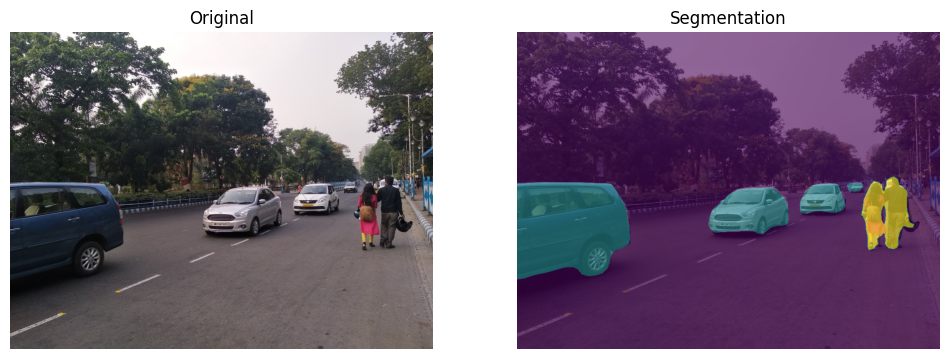

In [20]:
import torch
from torchvision.models.segmentation import deeplabv3_resnet101
from torchvision.models.segmentation import DeepLabV3_ResNet101_Weights
from PIL import Image
import matplotlib.pyplot as plt
import torch.nn.functional as F
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Use stronger backbone
weights = DeepLabV3_ResNet101_Weights.DEFAULT
model = deeplabv3_resnet101(weights=weights).to(device)
model.eval()

# Correct preprocessing
transform = weights.transforms()

img = Image.open("images/traffic.png").convert("RGB")
input_tensor = transform(img).unsqueeze(0).to(device)

with torch.no_grad():
    output = model(input_tensor)["out"]

# Resize to original image size
output = F.interpolate(
    output,
    size=img.size[::-1],  # (H, W)
    mode="bilinear",
    align_corners=False
)

pred = torch.argmax(output, dim=1)[0].cpu().numpy()

#def decode_segmap(mask):
#    colors = np.random.randint(0,255,(21,3))
#    return colors[mask]

seg_img = pred #decode_segmap(pred)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(img)
plt.imshow(seg_img, alpha=0.6)
plt.title("Segmentation")
plt.axis("off")
plt.show()

#### **with `torch.hub`**

Using cache found in C:\Users\sandi/.cache\torch\hub\pytorch_vision_v0.15.2


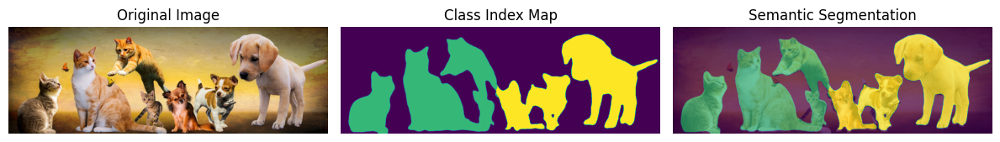

In [11]:
import torch
import torchvision.transforms as T
import torchvision
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Load pretrained DeepLabV3 model
model = torch.hub.load(
    'pytorch/vision:v0.15.2',
    'deeplabv3_resnet50',
    pretrained=True
)

model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Image preprocessing
transform = T.Compose([
    #T.Resize(520),
    T.ToTensor(),
    T.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Load image
img = Image.open("images/cats_dogs.jpg").convert("RGB")
input_tensor = transform(img).unsqueeze(0).to(device)

# Inference
with torch.no_grad():
    output = model(input_tensor)['out'][0]

# Get predicted class per pixel
pred = output.argmax(0).cpu().numpy()

def decode_segmap(mask, num_classes=21):
    # Pascal VOC color map
    label_colors = np.array([
        (0, 0, 0),       # background
        (128, 0, 0),     # aeroplane
        (0, 128, 0),
        (128, 128, 0),
        (0, 0, 128),
        (128, 0, 128),
        (0, 128, 128),
        (128, 128, 128),
        (64, 0, 0),
        (192, 0, 0),
        (64, 128, 0),
        (192, 128, 0),
        (64, 0, 128),
        (192, 0, 128),
        (64, 128, 128),
        (192, 128, 128),
        (0, 64, 0),
        (128, 64, 0),
        (0, 192, 0),
        (128, 192, 0),
        (0, 64, 128)
    ])

    rgb = label_colors[mask]
    return rgb

segmented_image = pred #decode_segmap(pred)

plt.figure(figsize=(12,5))

plt.subplot(1,3,1)
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(segmented_image)
plt.title("Class Index Map")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(img)
plt.imshow(segmented_image, alpha=0.7)
plt.title("Semantic Segmentation")
plt.axis('off')
plt.tight_layout()
plt.show()

#### **with `Keras_hub`**

#### **Perform semantic segmentation with a pretrained DeepLabv3+ model**

The highest level API in the KerasHub semantic segmentation API is the
`keras_hub.models` API. This API includes fully pretrained semantic segmentation
models, such as `keras_hub.models.DeepLabV3ImageSegmenter`.

Let's get started by constructing a DeepLabv3 pretrained on the Pascal VOC
dataset.
Also, define the preprocessing function for the model to preprocess images and
labels.
**Note:** By default `from_preset()` method in KerasHub loads the pretrained
task weights with all the classes, 21 classes in this case.

In [ ]:
model = keras_hub.models.DeepLabV3ImageSegmenter.from_preset(
    "deeplab_v3_plus_resnet50_pascalvoc"
)

image_converter = keras_hub.layers.DeepLabV3ImageConverter(
    image_size=(512, 512),
    interpolation="bilinear",
)
preprocessor = keras_hub.models.DeepLabV3ImageSegmenterPreprocessor(image_converter)

Let us visualize the results of this pretrained model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


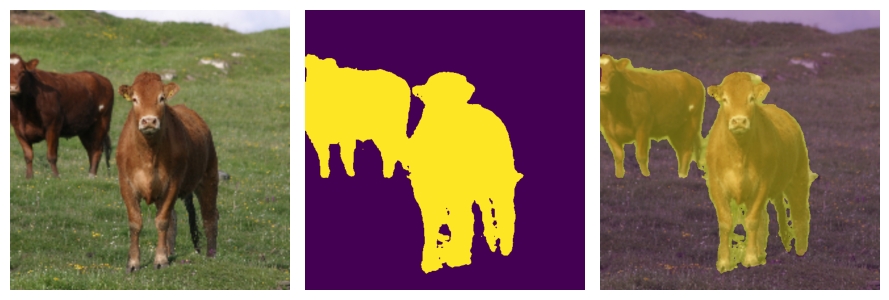

In [14]:
image = keras.utils.load_img('cow.png')
image = np.array(image)

image = preprocessor(image)
image = keras.ops.expand_dims(image, axis=0)
preds = ops.expand_dims(ops.argmax(model.predict(image), axis=-1), axis=-1)


def plot_segmentation(original_image, predicted_mask):
    plt.figure(figsize=(9, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(original_image[0] / 255)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(predicted_mask[0])
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(original_image[0] / 255)
    plt.imshow(predicted_mask[0], alpha=0.4)
    plt.axis("off")

    plt.tight_layout()
    plt.show()


plot_segmentation(image, preds)

#### **with `keras-cv` pretrained DeepLabV3 on PascalVOC**

In [ ]:
#!pip install keras_cv
import keras_cv
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# -----------------------
# Pascal VOC colormap
# -----------------------

def voc_colormap(N=256):
    cmap = np.zeros((N,3), dtype=np.uint8)

    for i in range(N):
        r=g=b=0
        cid=i
        for j in range(8):
            r |= ((cid>>0)&1)<<(7-j)
            g |= ((cid>>1)&1)<<(7-j)
            b |= ((cid>>2)&1)<<(7-j)
            cid >>=3
        cmap[i]=[r,g,b]

    return cmap

VOC_COLORS = voc_colormap()

# -----------------------
# Load pretrained model
# -----------------------

model = keras_cv.models.DeepLabV3Plus.from_preset(
    "deeplab_v3_plus_resnet50_pascalvoc"
)

def plot_seg(img, seg):
  # -----------------------
  # Convert to VOC colors
  # -----------------------

  seg_color = VOC_COLORS[seg]

  # -----------------------
  # Visualization
  # -----------------------

  plt.figure(figsize=(11,4))

  plt.subplot(1,3,1)
  plt.title("Input Image")
  plt.imshow(img)
  plt.axis("off")

  plt.subplot(1,3,2)
  plt.title("Segmentation (VOC colors)")
  plt.imshow(seg_color)
  plt.axis("off")

  plt.subplot(1,3,3)
  plt.title("Overlay")
  plt.imshow(img)
  plt.imshow(seg_color, alpha=0.5)
  plt.axis("off")
  plt.tight_layout()
  plt.show()


for IMAGE_PATH in ["bike.jpg", "man_horse.png", "plane.jpg", "cycle.jpg"]:
  # -----------------------
  # Load image
  # -----------------------
  img = Image.open(IMAGE_PATH).convert("RGB")
  img = img.resize((512,512))

  x = np.array(img).astype("float32")   # DO NOT divide by 255
  x = np.expand_dims(x,0)

  # -----------------------
  # Predict segmentation
  # -----------------------
  pred = model.predict(x)
  seg = np.argmax(pred[0], axis=-1)
  plot_seg(img, seg)

![](images/kerascv_deeplab_pascal_1.png)
![](images/kerascv_deeplab_pascal_2.png)

#### **1.3 with segmentation_models_pytorch**

Unified API for:

* UNet
* FPN
* DeepLab
* PSPNet

Backbones:

* ResNet
* EfficientNet
* MobileNet

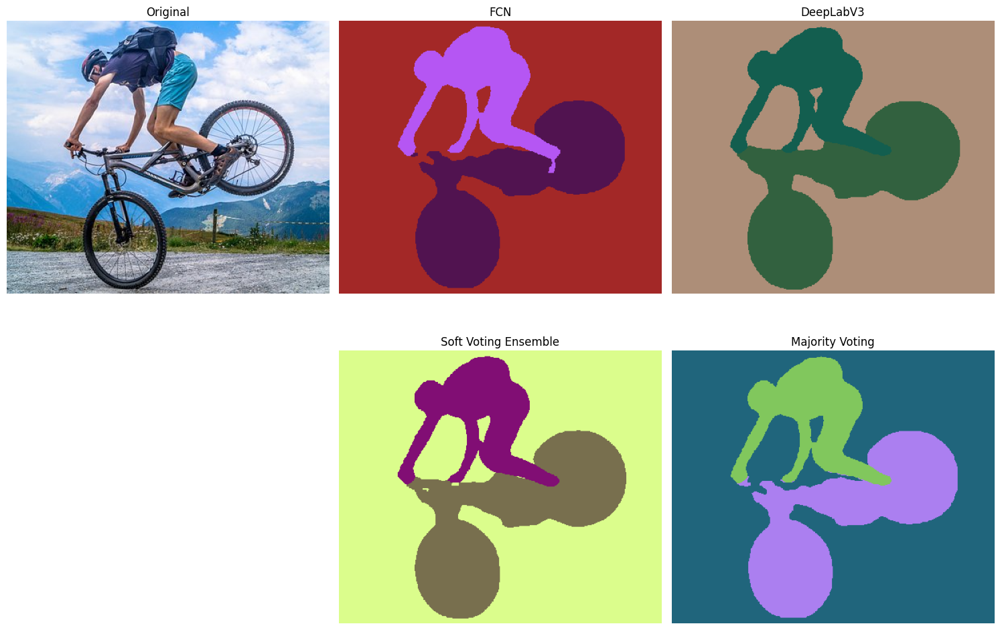

In [1]:
import torch
import torch.nn.functional as F
import segmentation_models_pytorch as smp
from torchvision.models.segmentation import fcn_resnet50, deeplabv3_resnet101
import cv2
import numpy as np
import matplotlib.pyplot as plt

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# ---------------------------------------------------
# 1️⃣ Load Models
# ---------------------------------------------------

models = []

# FCN (torchvision)
model_fcn = fcn_resnet50(weights="DEFAULT").to(DEVICE).eval()
models.append(("FCN", model_fcn))

# DeepLabV3
model_dl = deeplabv3_resnet101(weights="DEFAULT").to(DEVICE).eval()
models.append(("DeepLabV3", model_dl))

# ---------------------------------------------------
# 2️⃣ Preprocessing
# ---------------------------------------------------

preprocess = smp.encoders.get_preprocessing_fn("resnet34", "imagenet")

img = cv2.imread("images/cycle.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
orig_h, orig_w = img_rgb.shape[:2]

img_resized = cv2.resize(img_rgb, (512, 512))
img_norm = preprocess(img_resized)

img_tensor = torch.from_numpy(img_norm).permute(2,0,1).unsqueeze(0).float().to(DEVICE)

# ---------------------------------------------------
# 3️⃣ Run All Models
# ---------------------------------------------------

prob_maps = []
hard_masks = []

with torch.no_grad():
    for name, model in models:
        
        if name in ["FCN", "DeepLabV3"]:
            output = model(img_tensor)["out"]
        else:
            output = model(img_tensor)
        
        prob = F.softmax(output, dim=1)
        prob_maps.append(prob)
        
        mask = torch.argmax(prob, dim=1)
        hard_masks.append(mask)

# ---------------------------------------------------
# 4️⃣ Soft Voting Ensemble
# ---------------------------------------------------

ensemble_prob = torch.mean(torch.stack(prob_maps), dim=0)
ensemble_mask = torch.argmax(ensemble_prob, dim=1).squeeze().cpu().numpy()

# Resize back
ensemble_mask = cv2.resize(
    ensemble_mask.astype(np.uint8),
    (orig_w, orig_h),
    interpolation=cv2.INTER_NEAREST
)

# ---------------------------------------------------
# 5️⃣ Majority Voting
# ---------------------------------------------------

hard_stack = torch.stack(hard_masks)
majority_mask = torch.mode(hard_stack, dim=0)[0].squeeze().cpu().numpy()

majority_mask = cv2.resize(
    majority_mask.astype(np.uint8),
    (orig_w, orig_h),
    interpolation=cv2.INTER_NEAREST
)

# ---------------------------------------------------
# 6️⃣ Resize Individual Masks
# ---------------------------------------------------

individual_masks = []

for mask in hard_masks:
    m = mask.squeeze().cpu().numpy()
    m = cv2.resize(m.astype(np.uint8),
                   (orig_w, orig_h),
                   interpolation=cv2.INTER_NEAREST)
    individual_masks.append(m)

# ---------------------------------------------------
# 7️⃣ Visualization
# ---------------------------------------------------

def colorize(mask):
    colors = np.random.randint(0,255,(21,3))
    return colors[mask]

plt.figure(figsize=(20,10))

plt.subplot(2,4,1)
plt.imshow(img_rgb)
plt.title("Original")
plt.axis("off")

for i,(name,_) in enumerate(models):
    plt.subplot(2,4,i+2)
    plt.imshow(colorize(individual_masks[i]))
    plt.title(name)
    plt.axis("off")

plt.subplot(2,4,6)
plt.imshow(colorize(ensemble_mask))
plt.title("Soft Voting Ensemble")
plt.axis("off")

plt.subplot(2,4,7)
plt.imshow(colorize(majority_mask))
plt.title("Majority Voting")
plt.axis("off")

plt.tight_layout()
plt.show()

### **2. Instance Segmentation**

#### **2.1 Mask R-CNN**

Extends Faster R-CNN with mask branch: $L = L_{cls} + L_{box} + L_{mask}$

Available in `torchvision.models.detection`.

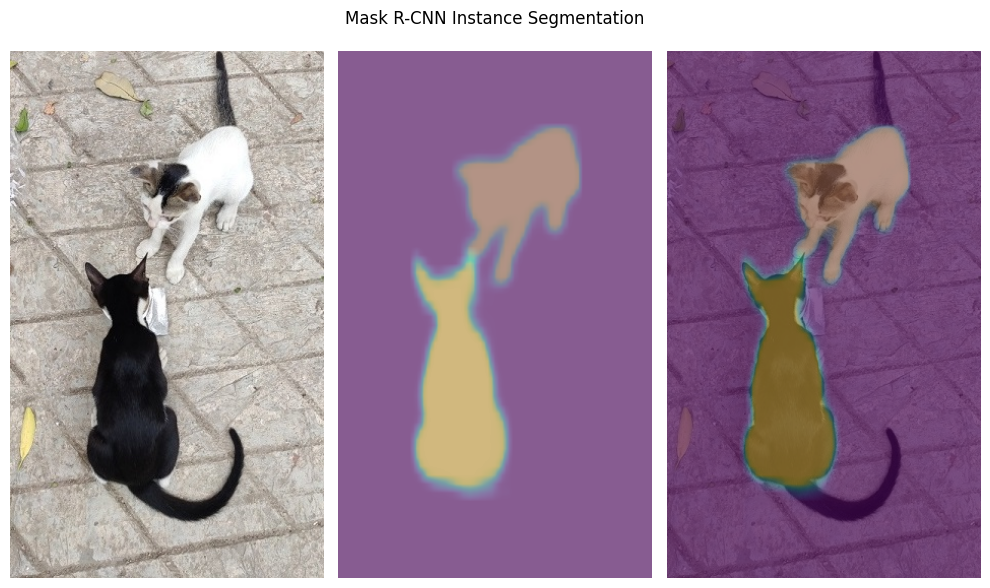

In [22]:
#%cd ..
import torch
import torchvision
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import requests
from io import BytesIO

device = "cuda" if torch.cuda.is_available() else "cpu"

# Load pretrained model
model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")
model.to(device)
model.eval()

# Load image
#url = "https://images.unsplash.com/photo-1492724441997-5dc865305da7"
#image = Image.open(BytesIO(requests.get(url).content)).convert("RGB")
image = Image.open('images/cats.jpg')

transform = transforms.ToTensor()
img_tensor = transform(image).unsqueeze(0).to(device)

# Inference
with torch.no_grad():
    outputs = model(img_tensor)

masks = outputs[0]['masks']
scores = outputs[0]['scores']

# Keep high confidence
keep = scores > 0.7
masks = masks[keep]

plt.figure(figsize=(10,6))
plt.subplot(131), plt.imshow(image), plt.axis('off')
plt.subplot(132) 
for m in masks:
    plt.imshow(m[0].cpu(), alpha=0.4)
plt.axis("off")
plt.subplot(133), plt.imshow(image)
for m in masks:
    plt.imshow(m[0].cpu(), alpha=0.4)
plt.axis("off")
plt.suptitle("Mask R-CNN Instance Segmentation")
plt.tight_layout()
plt.show()

### **3. Transformer-Based Segmentation**

#### **3.1 SegFormer (Vision Transformer)**

Self-attention: $Attention(Q,K,V) = softmax\left(\frac{QK^T}{\sqrt{d}}\right)V$

Model: `nvidia/segformer-b0-finetuned-ade-512-512`


#### **Patch Embeddings, Decoder Heads, and Rigorous Theory (Verified & Cited)**

Semantic segmentation assigns a class label to every pixel in an image: $S: \Omega \subset \mathbb{R}^2 \to \mathcal{C}$
where $\Omega$ is the image domain and $\mathcal{C}$ is the set of semantic classes.

Traditional CNN-based models such as DeepLabV3+ rely on convolutional inductive biases (locality and translation equivariance). However, convolution is fundamentally local.

Transformers, introduced in Attention Is All You Need, enable **global context modeling** via self-attention. This idea was extended to images in Vision Transformer (Dosovitskiy et al., ICLR 2021), forming the foundation for transformer-based segmentation models.

#### **Patch Embedding Formulation**

Let the input image be: $I \in \mathbb{R}^{H \times W \times C}$

* **Patch Partitioning**

    Divide the image into non-overlapping patches of size $P \times P$. Number of patches: $N = \frac{HW}{P^2}$. Each patch is flattened: $x_i \in \mathbb{R}^{P^2C}$.

* **Linear Projection (Patch Embedding)**

    Each patch is projected into a D-dimensional embedding space: $z_i = E x_i + b$, where:

    * $E \in \mathbb{R}^{D \times P^2C}$
    * $z_i \in \mathbb{R}^{D}$
    
    Stacking: $Z_0 = [z_1, \dots, z_N] \in \mathbb{R}^{N \times D}$
    
    In practice, this operation is equivalent to a convolution: $\text{Conv2D}(kernel=P, stride=P)$, which is mathematically identical to linear projection per patch (Dosovitskiy et al., 2021).

* **Positional Encoding**

    Since transformers are permutation invariant, positional information must be injected: $Z_0 = Z_0 + E_{pos}$ with: $E_{pos} \in \mathbb{R}^{N \times D}$. In the original ViT, these embeddings are learnable (Dosovitskiy et al., 2021).

    However:
    
    * Swin Transformer uses relative positional bias.
    * SegFormer explicitly removes positional encoding (Xie et al., NeurIPS 2021).

#### **Transformer Encoder**

Each encoder layer consists of:

* **Multi-Head Self-Attention (MHSA)**

    $$\text{Attention}(Q,K,V) = 
    \text{softmax}\left(
    \frac{QK^T}{\sqrt{d_k}}
    \right)V$$
    
    with:
    
    $$Q = ZW_Q,\quad
    K = ZW_K,\quad
    V = ZW_V$$
    
    Multi-head attention:
    
    $$\text{MHSA}(Z) = \text{Concat}(head_1,\dots,head_h)W_O$$

* **Complexity**

   Since:
    
   $$QK^T \in \mathbb{R}^{N \times N}$$
    
   Time complexity: $O(N^2 d)$
   
   Memory complexity: $O(N^2)$
    
   This quadratic scaling motivates hierarchical and windowed transformers in segmentation.


* **Feed Forward Network (FFN)**: $$\text{FFN}(x) = W_2 \sigma(W_1 x)$$

* **Residual Connections**

    $$Z' = \text{LayerNorm}(Z + \text{MHSA}(Z))$$
    
    $$Z_{l+1} = \text{LayerNorm}(Z' + \text{FFN}(Z'))$$
    
    This structure follows Vaswani et al. (2017).


#### **From Tokens to Dense Prediction**

After L encoder layers: $Z_L \in \mathbb{R}^{N \times D}$. To produce segmentation output, tokens must be mapped back to spatial structure. Assuming no padding: $Z_L \to \mathbb{R}^{\frac{H}{P} \times \frac{W}{P} \times D}$. 

Padding may be required if dimensions are not divisible by $P$.

#### **Decoder Heads for Segmentation**

Different segmentation models adopt different decoder strategies.

* **Pure ViT + Linear Decoder (SETR)**

    **SETR** (Zheng et al., CVPR 2021)
    
    * Uses pure ViT encoder
    * Reshapes tokens to spatial grid
    * Applies $1\times1$ convolution
    * Bilinear upsampling to full resolution
    
    Mathematically:
    
    $$\hat{Y} =  \text{Upsample}\left(W Z_L\right)$$
    
    This is equivalent to per-token classification followed by interpolation.


* **Hierarchical Transformer + Lightweight Decoder (SegFormer)**

    **SegFormer** introduces:
    
    * Overlapping patch embedding
    * Multi-stage hierarchical encoder
    * No positional encoding
    * Lightweight MLP decoder
    
    Multi-scale features:
    
    $$F = \text{Concat}(F_1, F_2, F_3, F_4)$$
    
    Final segmentation:
    
    $$\hat{Y} = \text{MLP}(F)$$
    
    This reduces computational cost while improving spatial resolution.
    

* **Mask Classification Decoder (Mask2Former)**

    Mask2Former (Cheng et al., CVPR 2022)
    
    Instead of pixel-wise classification: $p(c \mid x,y)$
    
    Mask2Former predicts: $\{(M_i, c_i)\}_{i=1}^{K}$
    
    where:
    
    * $M_i$ = predicted mask
    * $c_i$ = class label
    
    Final segmentation: $S(x,y) = \arg\max\limits_i M_i(x,y)$
    
    This unifies semantic, instance, and panoptic segmentation.

#### **Pixel Classification vs Token Modeling vs Mask Classification**

**CNN-based segmentation**: $p(c \mid x,y) = \text{softmax}(W h_{x,y})$ where $h_{x,y}$ depends on local receptive field.

**ViT-based segmentation**: $Z_L = f_\theta(\{x_1,\dots,x_N\})$. Each token interacts globally through attention.

cuda


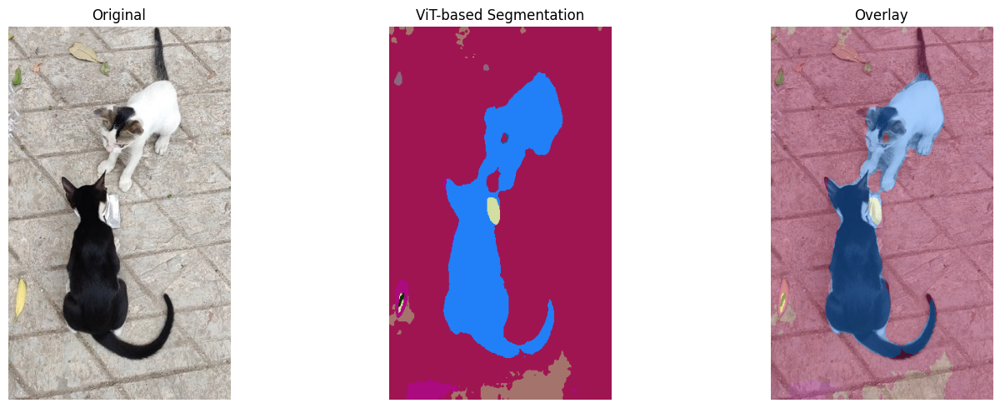

In [37]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

# -------------------------
# Load Semantic Model
# -------------------------
model_name = "nvidia/segformer-b0-finetuned-ade-512-512"
processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForSemanticSegmentation.from_pretrained(model_name).to(device)


def colorize(mask):
    if isinstance(mask, torch.Tensor):
        mask = mask.cpu().numpy()

    mask = mask.astype(np.int32)
    np.random.seed(0)
    colormap = np.random.randint(0, 255, (256, 3), dtype=np.uint8)
    return colormap[mask]


def run_segmentation(image_path):

    image = Image.open(image_path).convert("RGB")
    image_np = np.array(image)

    inputs = processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)

    segmentation = processor.post_process_semantic_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0]

    seg_color = colorize(segmentation)
    overlay = (0.6 * image_np + 0.4 * seg_color).astype(np.uint8)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(image_np)
    axes[0].set_title("Original")
    axes[0].axis("off")

    axes[1].imshow(seg_color)
    axes[1].set_title("ViT-based Segmentation")
    axes[1].axis("off")

    axes[2].imshow(overlay)
    axes[2].set_title("Overlay")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()


run_segmentation("images/cats.jpg")

#### **with HuggingFace pretrained models to segment Camvid, Cityscapes and ADE20k images**

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# -----------------------------
# DATASET CONFIG
# -----------------------------
datasets = {
    "ADE20K": {
        "model": "nvidia/segformer-b5-finetuned-ade-640-640",
        "image": "ade2.jpg"
    },
    "Cityscapes": {
        "model": "nvidia/segformer-b2-finetuned-cityscapes-1024-1024",
        "image": "cityscape2.png"
    },
    "CamVid": {
        "model": "nvidia/segformer-b2-finetuned-cityscapes-1024-1024",
        "image": "camvid.png"
    }
}

# -----------------------------
# DATASET COLOR PALETTES
# -----------------------------
cityscapes_palette = np.array([
    [128,64,128],[244,35,232],[70,70,70],[102,102,156],[190,153,153],
    [153,153,153],[250,170,30],[220,220,0],[107,142,35],[152,251,152],
    [70,130,180],[220,20,60],[255,0,0],[0,0,142],[0,0,70],
    [0,60,100],[0,80,100],[0,0,230],[119,11,32]
])

camvid_palette = np.array([
    [128,128,128],[128,0,0],[192,192,128],[128,64,128],[60,40,222],
    [128,128,0],[192,128,128],[64,64,128],[64,0,128],[64,64,0],
    [0,128,192],[0,0,0]
])

# ADE20K palette (simplified)
ade_palette = np.random.randint(0,255,(150,3))

# -----------------------------
# COLORIZE MASK
# -----------------------------
def colorize_mask(mask, palette):
    h, w = mask.shape
    color_mask = np.zeros((h,w,3), dtype=np.uint8)

    for label in range(len(palette)):
        color_mask[mask == label] = palette[label]

    return color_mask


# -----------------------------
# INFERENCE FUNCTION
# -----------------------------
def segment_image(image, model_name):

    processor = SegformerImageProcessor.from_pretrained(model_name)
    model = SegformerForSemanticSegmentation.from_pretrained(model_name).to(DEVICE)

    inputs = processor(images=image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        outputs = model(**inputs)

    logits = outputs.logits

    upsampled_logits = torch.nn.functional.interpolate(
        logits,
        size=image.size[::-1],
        mode="bilinear",
        align_corners=False
    )

    mask = upsampled_logits.argmax(dim=1)[0].cpu().numpy()

    return mask


# -----------------------------
# VISUALIZATION
# -----------------------------
fig, axes = plt.subplots(3,3, figsize=(12,9))

for i,(dataset,info) in enumerate(datasets.items()):

    image = Image.open(info["image"]).convert("RGB")
    mask = segment_image(image, info["model"])

    # Select palette
    if dataset == "Cityscapes":
        palette = cityscapes_palette
    elif dataset == "CamVid":
        palette = camvid_palette
    else:
        palette = ade_palette

    color_mask = colorize_mask(mask, palette)

    overlay = np.array(image).copy()
    overlay = (0.5*overlay + 0.5*color_mask).astype(np.uint8)

    axes[i,0].imshow(image)
    axes[i,0].set_title(f"{dataset} Image")
    axes[i,0].axis("off")

    axes[i,1].imshow(color_mask)
    axes[i,1].set_title("Prediction")
    axes[i,1].axis("off")

    axes[i,2].imshow(overlay)
    axes[i,2].set_title("Overlay")
    axes[i,2].axis("off")

plt.tight_layout()
plt.show()

![](images/hf_segformer.png)

#### **3.2 Mask2Former**

Unified model for:

* Semantic
* Instance
* Panoptic segmentation

Model:

* `facebook/mask2former-swin-large-ade-semantic`

#### **Mask classification (Mask2Former)**

Segmentation is formulated as **set prediction**, optimized via Hungarian matching:

$$\mathcal{L} = \mathcal{L}_{cls} + \lambda \mathcal{L}_{mask} + \mu \mathcal{L}_{dice}$$

This represents a conceptual shift from pixel classification to mask prediction.

#### **Theoretical Interpretation**

Transformer segmentation enables:

* Global dependency modeling
* Improved boundary coherence
* Unified architecture across tasks

Evolution:

$$\textbf{CNN Pixel Classification}
\rightarrow
\textbf{ViT Token Modeling}
\rightarrow
\textbf{Mask Classification}$$

This progression is supported by:

* Dosovitskiy et al. (2021)
* Zheng et al. (2021)
* Xie et al. (2021)
* Cheng et al. (2022)

cuda


`label_ids_to_fuse` unset. No instance will be fused.


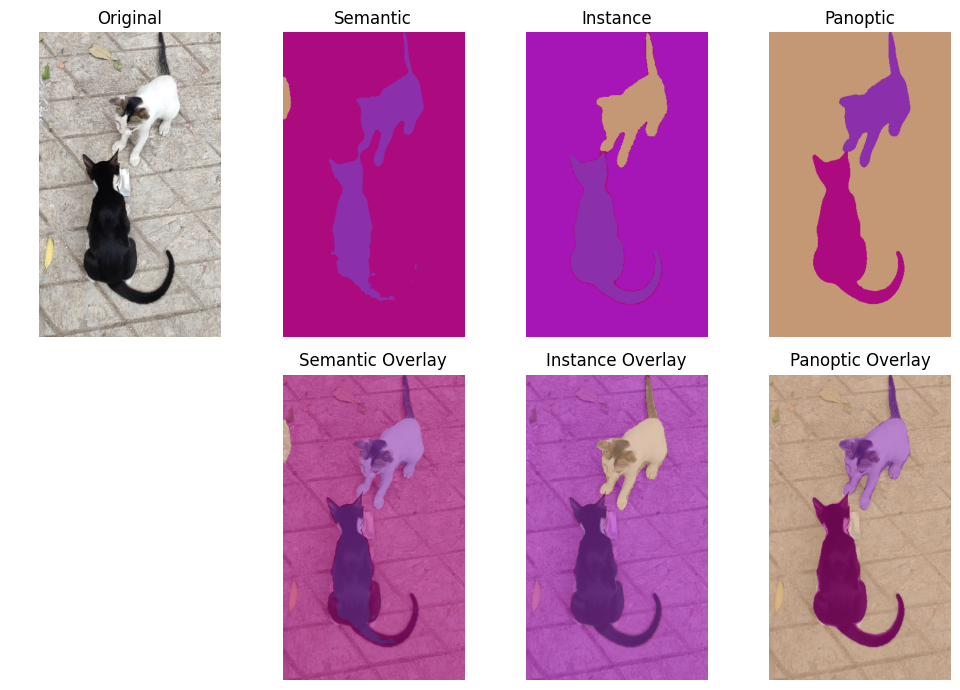

In [35]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from transformers import (
    AutoImageProcessor,
    AutoModelForSemanticSegmentation,
    Mask2FormerImageProcessor,
    Mask2FormerForUniversalSegmentation,
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

# -------------------------
# Load Semantic Model
# -------------------------
#model_name = "nvidia/segformer-b0-finetuned-ade-512-512"
#sem_processor = SegformerFeatureExtractor.from_pretrained(model_name)
#sem_model = SegformerForSemanticSegmentation.from_pretrained(model_name).to(device)

# Load semantic pretrained model
sem_processor = Mask2FormerImageProcessor.from_pretrained(
    "facebook/mask2former-swin-large-ade-semantic"
)

sem_model = Mask2FormerForUniversalSegmentation.from_pretrained(
    "facebook/mask2former-swin-large-ade-semantic"
).to(device)

# -------------------------
# Load Mask2Former
# -------------------------
mask_processor = Mask2FormerImageProcessor.from_pretrained(
    "facebook/mask2former-swin-large-coco-panoptic"
)
mask_model = Mask2FormerForUniversalSegmentation.from_pretrained(
    "facebook/mask2former-swin-large-coco-panoptic"
).to(device)


# -------------------------
# Utility: Color Map
# -------------------------
def colorize(mask, num_colors=256):
    if isinstance(mask, torch.Tensor):
        mask = mask.detach().cpu().numpy()

    mask = np.nan_to_num(mask)
    mask = mask.astype(np.int64)

    # Normalize labels if very large
    unique_vals = np.unique(mask)
    label_map = {val: i for i, val in enumerate(unique_vals)}
    normalized_mask = np.vectorize(label_map.get)(mask)

    np.random.seed(0)
    colormap = np.random.randint(0, 255, (len(unique_vals), 3), dtype=np.uint8)

    return colormap[normalized_mask]
    
def overlay(image, mask, alpha=0.6):
    return (np.array(image) * (1 - alpha) + np.array(mask) * alpha).astype(np.uint8)

# -------------------------
# Main Function
# -------------------------
def segment_and_display(image_path):

    image = Image.open(image_path).convert("RGB")
    image_np = np.array(image)
    # ==============================
    # 1️⃣ Semantic Segmentation
    # ==============================
    inputs = sem_processor(images=image, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = sem_model(**inputs)

    #sem_map = sem_processor.post_process_semantic_segmentation(
    #    outputs, target_sizes=[image.size[::-1]]
    #)[0].cpu().numpy()

    segmentation = processor.post_process_semantic_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0]

    sem_color = colorize(segmentation)
    sem_overlay = overlay(image, sem_color)

    
    #logits = torch.nn.functional.interpolate(
    #    outputs.logits,
    #    size=image.size[::-1],
    #    mode="bilinear",
    #    align_corners=False,
    #)

    

    #mask = logits.argmax(dim=1)[0].cpu().numpy()
    #sem_color = colorize(mask)
    #sem_overlay = overlay(image, sem_color)

    # ==============================
    # 2️⃣ Instance Segmentation
    # ==============================
    inputs = mask_processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = mask_model(**inputs)

    instance_result = mask_processor.post_process_instance_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0]

    if "segmentation" in instance_result:
        inst_map = instance_result["segmentation"].cpu().numpy()
    else:
        inst_map = np.zeros((image_np.shape[0], image_np.shape[1]))

    inst_color = colorize(inst_map)
    inst_overlay = overlay(image_np, inst_color)

    # ==============================
    # 3️⃣ Panoptic Segmentation
    # ==============================
    panoptic_result = mask_processor.post_process_panoptic_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0]

    pan_map = panoptic_result["segmentation"].cpu().numpy()
    pan_color = colorize(pan_map)
    pan_overlay = overlay(image_np, pan_color)

    # ==============================
    # Create 2x4 Grid
    # ==============================
    fig, axes = plt.subplots(2, 4, figsize=(10, 7))

    axes[0, 0].imshow(image_np)
    axes[0, 0].set_title("Original")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(sem_color)
    axes[0, 1].set_title("Semantic")
    axes[0, 1].axis("off")

    axes[1, 1].imshow(sem_overlay)
    axes[1, 1].set_title("Semantic Overlay")
    axes[1, 1].axis("off")

    axes[0, 2].imshow(inst_color)
    axes[0, 2].set_title("Instance")
    axes[0, 2].axis("off")

    axes[1, 2].imshow(inst_overlay)
    axes[1, 2].set_title("Instance Overlay")
    axes[1, 2].axis("off")

    axes[0, 3].imshow(pan_color)
    axes[0, 3].set_title("Panoptic")
    axes[0, 3].axis("off")

    axes[1, 3].imshow(pan_overlay)
    axes[1, 3].set_title("Panoptic Overlay")
    axes[1, 3].axis("off")

    axes[1, 0].axis("off")  # empty cell

    plt.tight_layout()
    plt.show()


# -------------------------
# Run
# -------------------------
segment_and_display("images/cats.jpg")

#### **3.3 Segmenting Images from Cityscape and ADE20 Dataset with Pretrained OneFormer**

In [ ]:
#!pip install transformers torch pillow requests matplotlib -q
import numpy as np
import torch
import requests
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
from io import BytesIO
from transformers import OneFormerProcessor, OneFormerForUniversalSegmentation

# ── Official Cityscapes 19-class train palette (trainId → RGB) ───────────────
# Source: github.com/mcordts/cityscapesScripts
CITYSCAPES_CLASSES = [
    "road", "sidewalk", "building", "wall", "fence", "pole",
    "traffic light", "traffic sign", "vegetation", "terrain", "sky",
    "person", "rider", "car", "truck", "bus", "train", "motorcycle", "bicycle"
]
CITYSCAPES_PALETTE = np.array([
    [128,  64, 128],   #  0 road
    [244,  35, 232],   #  1 sidewalk
    [ 70,  70,  70],   #  2 building
    [102, 102, 156],   #  3 wall
    [190, 153, 153],   #  4 fence
    [153, 153, 153],   #  5 pole
    [250, 170,  30],   #  6 traffic light
    [220, 220,   0],   #  7 traffic sign
    [107, 142,  35],   #  8 vegetation
    [152, 251, 152],   #  9 terrain
    [ 70, 130, 180],   # 10 sky
    [220,  20,  60],   # 11 person
    [255,   0,   0],   # 12 rider
    [  0,   0, 142],   # 13 car
    [  0,   0,  70],   # 14 truck
    [  0,  60, 100],   # 15 bus
    [  0,  80, 100],   # 16 train
    [  0,   0, 230],   # 17 motorcycle
    [119,  11,  32],   # 18 bicycle
], dtype=np.uint8)

# ── Official ADE20K 150-class palette ────────────────────────────────────────
# Source: MIT CSAIL / tensorflow deeplab colormap
def create_ade20k_palette():
    """Generates the official ADE20K 150-class color palette."""
    palette = np.zeros((150, 3), dtype=np.uint8)
    for idx in range(150):
        r, g, b, i = 0, 0, 0, idx
        for j in range(8):
            r |= ((i >> 0) & 1) << (7 - j)
            g |= ((i >> 1) & 1) << (7 - j)
            b |= ((i >> 2) & 1) << (7 - j)
            i >>= 3
        palette[idx] = [r, g, b]
    return palette

ADE20K_PALETTE = create_ade20k_palette()

# First 10 ADE20K class names for reference
ADE20K_CLASSES_SAMPLE = [
    "wall", "building", "sky", "floor", "tree", "ceiling",
    "road", "bed", "windowpane", "grass"
]

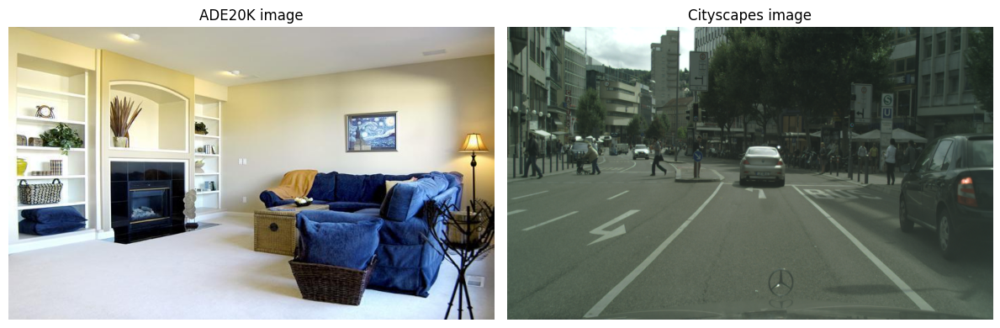

ADE20K     : (711, 471)
Cityscapes : (2048, 1024)


In [5]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

ade20k_image     = Image.open('images/ADE_val_00000519.png').convert('RGB')
cityscapes_image = Image.open('images/stuttgart_00_000000_000113_leftImg8bit.png').convert('RGB')

# Verify
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(ade20k_image, aspect='auto');     axes[0].set_title("ADE20K image");     axes[0].axis("off")
axes[1].imshow(cityscapes_image, aspect='auto'); axes[1].set_title("Cityscapes image"); axes[1].axis("off")
plt.tight_layout()
plt.show()
print(f"ADE20K     : {ade20k_image.size}")
print(f"Cityscapes : {cityscapes_image.size}")

In [13]:
device = "cuda" if torch.cuda.is_available() else "cpu"

ade_processor  = OneFormerProcessor.from_pretrained("shi-labs/oneformer_ade20k_swin_large")
ade_model      = OneFormerForUniversalSegmentation.from_pretrained("shi-labs/oneformer_ade20k_swin_large").to(device).eval()

city_processor = OneFormerProcessor.from_pretrained("shi-labs/oneformer_cityscapes_swin_large")
city_model     = OneFormerForUniversalSegmentation.from_pretrained("shi-labs/oneformer_cityscapes_swin_large").to(device).eval()

Loading weights:   0%|          | 0/826 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/826 [00:00<?, ?it/s]

In [17]:
def colorize_semantic(seg_map, palette):
    """Map class-id seg map → RGB using official palette."""
    h, w   = seg_map.shape
    color  = np.zeros((h, w, 3), dtype=np.uint8)
    for cls_id in np.unique(seg_map):
        if cls_id < len(palette):
            color[seg_map == cls_id] = palette[cls_id]
        else:
            # fallback for unknown ids
            np.random.seed(int(cls_id))
            color[seg_map == cls_id] = np.random.randint(0, 255, 3)
    return color

def run_inference(image, processor, model, palette, class_names):
    inputs = processor(image, [task], return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}

    with torch.no_grad():
        outputs = model(**inputs)

    size = [image.size[::-1]]  # (H, W)

    result      = processor.post_process_semantic_segmentation(outputs, target_sizes=size)[0]
    seg_map     = result.cpu().numpy()
    color_map   = colorize_semantic(seg_map, palette)
    # Build legend for detected classes
    legend = [
        mpatches.Patch(color=palette[i] / 255.0,
                       label=f"{class_names[i] if i < len(class_names) else i}")
        for i in np.unique(seg_map) if i < len(palette)
    ]

    overlay = (np.array(image.resize(color_map.shape[1::-1])) * 0.45
               + color_map * 0.55).clip(0, 255).astype(np.uint8)

    return color_map, overlay, legend

In [20]:
import matplotlib.patches as mpatches
from PIL import Image
from pathlib import Path
import torch

def segment_image(image, processor, model, palette, class_names, dataset_label, device):
    # ── Inference ──────────────────────────────────────────────────────
    inputs  = {k: v.to(device) for k, v in
               processor(image, ["semantic"], return_tensors="pt").items()}
    with torch.no_grad():
        seg_map = processor.post_process_semantic_segmentation(
                      model(**inputs), target_sizes=[image.size[::-1]]
                  )[0].cpu().numpy()

    # ── Colorize ───────────────────────────────────────────────────────
    color_map = palette[np.clip(seg_map, 0, len(palette) - 1)]
    overlay   = (np.array(image) * 0.45 + color_map * 0.55).clip(0, 255).astype(np.uint8)

    # ── Legend (detected classes sorted by coverage) ───────────────────
    legend = sorted([
        mpatches.Patch(color=palette[i] / 255.0,
                       label=f"{class_names[i]} ({(seg_map==i).mean()*100:.1f}%)")
        for i in np.unique(seg_map) if i < len(class_names)
    ], key=lambda p: float(p.get_label().split("(")[1].rstrip("%)")) , reverse=True)

    # ── Plot & save ────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 3, figsize=(20, 7), gridspec_kw={"wspace": 0.04})
    for ax, img, title in zip(axes, [image, color_map, overlay],
                              ["Original", "Segmentation Map", "Overlay"]):
        ax.imshow(img); ax.set_title(title, fontsize=12); ax.axis("off")

    fig.legend(handles=legend, loc="lower center", ncol=min(6, len(legend)),
               fontsize=8, framealpha=0.85, bbox_to_anchor=(0.5, -0.02))
    fig.suptitle(f"{dataset_label} — {img_path.name}", fontsize=12, fontweight="bold", y=1.01)

    plt.show()

device = "cuda" if torch.cuda.is_available() else "cpu"

segment_image(ade20k_image, 
    processor     = ade_processor,
    model         = ade_model,
    palette       = ADE20K_PALETTE,
    class_names   = list(ade_model.config.id2label.values()),
    dataset_label = "ADE20K",
    device        = device)

![](images/segmented_ADE_val_00000519.png)
![](images/seg_ade20k.gif)

In [ ]:
segment_image(cityscapes_image, 
    processor     = city_processor,
    model         = city_model,
    palette       = CITYSCAPES_PALETTE,
    class_names   = CITYSCAPES_CLASSES,
    dataset_label = "Cityscapes",
    device        = device
)\

![](images/segmented_stuttgart_00_000000_000113_leftImg8bit.png)
![](images/seg_cityscapes.gif)

### **4. Foundation and Prompt-Based Segmentation**

#### **4.1 Segment Anything Model (SAM)**

Prompt-driven segmentation using:

* Points
* Boxes
* Masks

Checkpoint:

* `sam_vit_h_4b8939.pth`

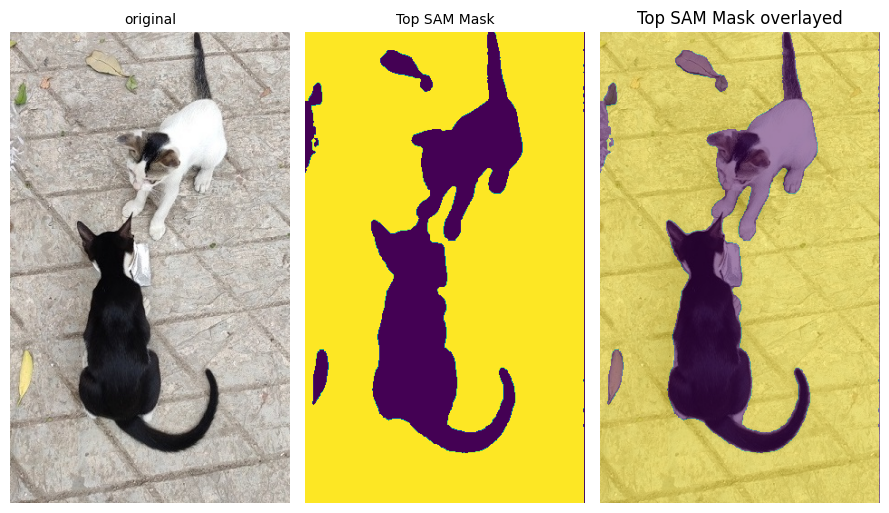


🧠 Ollama Description:
 The image you've shared is a creative take on an optical illusion, where a cat appears to be standing on a tiled floor. Here's a detailed description:

- **Subject**: The image features a black and white cat standing on a tiled floor.
- **Cat**: The cat is the focal point of the image, appearing as if it's sitting or standing in the foreground on the tiled floor. It has distinctive black markings that make it visually interesting.
- **Tiles**: The background consists of gray tiles laid out in a grid pattern. These tiles are arranged in such a way that they create an optical illusion, making it appear as if the cat is sitting or standing on them.
- **Optical Illusion**: The cat's position relative to the tiles gives the impression that it's standing on the tiles, thanks to the perspective and arrangement of the tiles. This clever design creates a fascinating visual effect.

The image doesn't contain any text. It's purely visual, relying on the interaction between

In [4]:
# https://github.com/facebookresearch/segment-anything?tab=readme-ov-file#model-checkpoints
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator
import base64
import requests

# -----------------------------
# 1️⃣ FORCE GPU + VERIFY
# -----------------------------
assert torch.cuda.is_available(), "CUDA not available. Install GPU PyTorch."

device = torch.device("cuda")
print("Using GPU:", torch.cuda.get_device_name(0))

# Enable cudnn autotuner
torch.backends.cudnn.benchmark = True

# -----------------------------
# 2️⃣ Load SAM (FP16 + eval)
# -----------------------------
sam_checkpoint = "models/sam_vit_h_4b8939.pth"
model_type = "vit_h"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device)
sam.eval()

# Use mixed precision
sam = sam.half()

# -----------------------------
# 3️⃣ Optimized Mask Generator
# -----------------------------
mask_generator = SamAutomaticMaskGenerator(
    sam,
    points_per_side=16,          # ↓ default 32 → 4x faster
    pred_iou_thresh=0.88,
    stability_score_thresh=0.92,
    crop_n_layers=1,             # ↓ reduce pyramid crops
    min_mask_region_area=100
)

# -----------------------------
# 4️⃣ Load + Resize Image
# -----------------------------
image_path = "images/cats.jpg"
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Resize large images (critical for speed)
max_size = 1024
h, w = image_rgb.shape[:2]
scale = max_size / max(h, w)

if scale < 1:
    image_rgb = cv2.resize(image_rgb, (int(w * scale), int(h * scale)))

# -----------------------------
# 5️⃣ Generate Masks (NO GRAD)
# -----------------------------
with torch.no_grad():
    with torch.cuda.amp.autocast():
        masks = mask_generator.generate(image_rgb)

print(f"Total masks detected: {len(masks)}")

# -----------------------------
# 6️⃣ Postprocess
# -----------------------------
masks = sorted(masks, key=lambda x: x['area'], reverse=True)
top_mask = masks[0]['segmentation']

# -----------------------------
# 7️⃣ Visualization
# -----------------------------
plt.figure(figsize=(9,6))
plt.subplot(131), plt.imshow(image_rgb), plt.axis('off'), plt.title('original', size=10)
plt.subplot(132), plt.imshow(top_mask), plt.axis('off'), plt.title('Top SAM Mask', size=10)
plt.subplot(133), plt.imshow(image_rgb), plt.imshow(top_mask, alpha=0.5), plt.axis('off'), plt.title('original', size=10),
plt.title("Top SAM Mask overlayed")
plt.tight_layout()
plt.show()

# -----------------------------
# 5️⃣ Extract Object Crop
# -----------------------------
mask = top_mask.astype(np.uint8)
object_crop = image_rgb * mask[..., None]

crop_path = "images/object_crop.jpg"
cv2.imwrite(crop_path, cv2.cvtColor(object_crop, cv2.COLOR_RGB2BGR))

# -----------------------------
# 6️⃣ Send to Ollama (LLaVA)
# -----------------------------
# !ollama pull llava
with open(crop_path, "rb") as f:
    img_base64 = base64.b64encode(f.read()).decode("utf-8")

response = requests.post(
    "http://localhost:11434/api/generate",
    json={
        "model": "llava",
        "prompt": "Describe this segmented object in detail.",
        "images": [img_base64],
        "stream": False
    }
)

print("\n🧠 Ollama Description:")
print(response.json()["response"])

### **5. Diffusion-Based Segmentation**

Uses denoising diffusion probabilistic models for mask generation.

Promising generative segmentation paradigm.

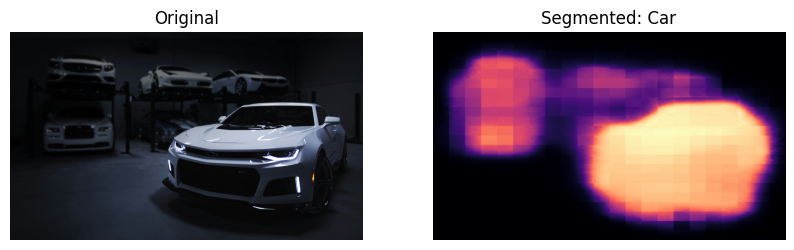

In [10]:
import torch
import matplotlib.pyplot as plt
from PIL import Image
import requests
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation

# Device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load pretrained segmentation model
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained(
    "CIDAS/clipseg-rd64-refined"
).to(device)

# Load image
url = "https://images.unsplash.com/photo-1492144534655-ae79c964c9d7"
image = Image.open(requests.get(url, stream=True).raw).convert("RGB")

# Define what you want to segment
prompt = "car"

# Preprocess
inputs = processor(text=prompt, images=image, return_tensors="pt").to(device)

# Inference
with torch.no_grad():
    outputs = model(**inputs)

mask = outputs.logits.unsqueeze(1)
mask = torch.sigmoid(mask)

# Resize to original
mask = torch.nn.functional.interpolate(
    mask,
    size=image.size[::-1],
    mode="bilinear",
    align_corners=False,
)

mask_np = mask[0, 0].cpu().numpy()

# Visualization
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mask_np, cmap="magma")
plt.title("Segmented: Car")
plt.axis("off")

plt.show()

### **6. Practical Applications**

#### **6.1 Background Blurring with MediaPipe + DeepLabV3 (`TFLite`)**

Real-time segmentation for mobile applications. Let's start with the base imports for running this MediaPipe sample. The next thing you will need to do is download the image segmentation model that will be used for this demo. In this case you will use the DeepLab v3 model.

After downloading the model, it's time to grab an image that you can use for testing! It's worth noting that while this is working with a single image, you can download a collection of images to store in the `IMAGE_FILENAMES` array. With the test image downloaded, go ahead and display it. 

#### **Running inference and visualizing the results**
To run inference using the image segmentation MediaPipe Task, you will need to initialize the `ImageSegmenter` using the model. This example will separate the background and foreground of the image and apply separate colors for them to highlight where each distinctive area exists. Image segmentation here will use a category mask, which applies a category to each found item based on confidence. Now that you know how to separate the foreground and background of an image, let's take it a step further and blur the background for an effect similar to what is provided by Google Hangouts.

In [ ]:
#run in colab
#!pip install gradio mediapipe
#!wget -O deeplabv3.tflite -q https://storage.googleapis.com/mediapipe-models/image_segmenter/deeplab_v3/float32/1/deeplab_v3.tflite
import gradio as gr
import numpy as np
import cv2
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

# Load DeepLabV3 TFLite once
base_options = python.BaseOptions(model_asset_path="deeplabv3.tflite")
options = vision.ImageSegmenterOptions(
    base_options=base_options,
    output_category_mask=True
)
segmenter = vision.ImageSegmenter.create_from_options(options)

def segment_and_blur(img):
    # Convert numpy image to MediaPipe Image
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=img)
    result = segmenter.segment(mp_image)
    mask = result.category_mask.numpy_view().squeeze()

    # Binary mask
    binary_mask = (mask > 0.2).astype(np.uint8) * 255
    binary_mask_rgb = np.stack([binary_mask]*3, axis=-1)

    # Blur background
    blurred = cv2.GaussianBlur(img, (55, 55), 0)
    condition = mask > 0.1
    final = np.where(condition[..., None], img, blurred)

    return img, binary_mask_rgb, final

with gr.Blocks() as demo:
    gr.Markdown("## DeepLabV3 Background Blur (TFLite + MediaPipe)")
    with gr.Row():
        input_img = gr.Image(type="numpy", label="Upload Image")
    with gr.Row():
        out1 = gr.Image(label="Original")
        out2 = gr.Image(label="Binary Segmentation")
        out3 = gr.Image(label="Background Blurred")

    input_img.change(segment_and_blur, input_img, [out1, out2, out3])

demo.launch()

![](images/gradio_bblur.png)

#### **6.2 Detectron2**

Production-ready segmentation framework supporting:

* Semantic
* Instance
* Panoptic


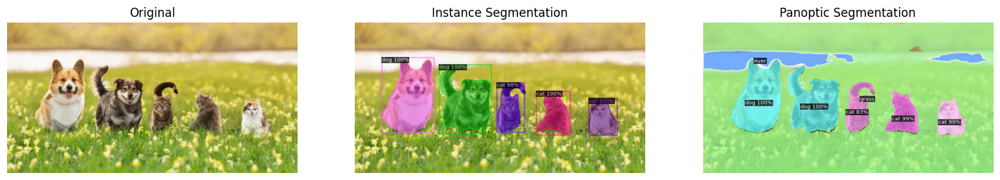

In [6]:
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np

from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# Device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load image
image_path = "../dogs_cats.jpg"
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# ----------------------------
# 1️⃣ INSTANCE SEGMENTATION
# ----------------------------

cfg_instance = get_cfg()
cfg_instance.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"
    )
)
cfg_instance.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"
)
cfg_instance.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg_instance.MODEL.DEVICE = device

predictor_instance = DefaultPredictor(cfg_instance)
outputs_instance = predictor_instance(image)

v_instance = Visualizer(
    image_rgb,
    MetadataCatalog.get(cfg_instance.DATASETS.TRAIN[0]),
    scale=1.2
)

instance_result = v_instance.draw_instance_predictions(
    outputs_instance["instances"].to("cpu")
)

# ----------------------------
# 2️⃣ PANOPTIC SEGMENTATION
# ----------------------------

cfg_panoptic = get_cfg()
cfg_panoptic.merge_from_file(
    model_zoo.get_config_file(
        "COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"
    )
)
cfg_panoptic.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"
)
cfg_panoptic.MODEL.DEVICE = device

predictor_panoptic = DefaultPredictor(cfg_panoptic)
panoptic_seg, segments_info = predictor_panoptic(image)["panoptic_seg"]

v_panoptic = Visualizer(
    image_rgb,
    MetadataCatalog.get(cfg_panoptic.DATASETS.TRAIN[0]),
    scale=1.2
)

panoptic_result = v_panoptic.draw_panoptic_seg_predictions(
    panoptic_seg.to("cpu"),
    segments_info
)

# ----------------------------
# 3️⃣ Visualization
# ----------------------------

plt.figure(figsize=(18,6))

plt.subplot(1,3,1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(instance_result.get_image())
plt.title("Instance Segmentation")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(panoptic_result.get_image())
plt.title("Panoptic Segmentation")
plt.axis("off")

plt.show()

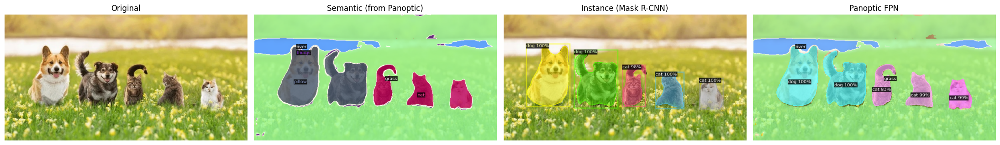

In [9]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt

from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog

device = "cuda" if torch.cuda.is_available() else "cpu"

# Load image
image_path = "../dogs_cats.jpg"
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# =====================================================
# 1️⃣ INSTANCE SEGMENTATION (Mask R-CNN)
# =====================================================
cfg_ins = get_cfg()
cfg_ins.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"
    )
)
cfg_ins.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"
)
cfg_ins.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg_ins.MODEL.DEVICE = device

predictor_ins = DefaultPredictor(cfg_ins)
outputs_ins = predictor_ins(image)

v_ins = Visualizer(
    image_rgb,
    MetadataCatalog.get(cfg_ins.DATASETS.TRAIN[0]),
    scale=1.2
)

ins_result = v_ins.draw_instance_predictions(
    outputs_ins["instances"].to("cpu")
)

# =====================================================
# 2️⃣ PANOPTIC SEGMENTATION
# =====================================================
cfg_pan = get_cfg()
cfg_pan.merge_from_file(
    model_zoo.get_config_file(
        "COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"
    )
)
cfg_pan.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"
)
cfg_pan.MODEL.DEVICE = device

predictor_pan = DefaultPredictor(cfg_pan)
panoptic_seg, segments_info = predictor_pan(image)["panoptic_seg"]

metadata = MetadataCatalog.get(cfg_pan.DATASETS.TRAIN[0])

v_pan = Visualizer(image_rgb, metadata, scale=1.2)
pan_result = v_pan.draw_panoptic_seg_predictions(
    panoptic_seg.to("cpu"),
    segments_info
)

# =====================================================
# 3️⃣ SEMANTIC FROM PANOPTIC
# =====================================================
panoptic_np = panoptic_seg.to("cpu").numpy()

semantic_map = np.zeros_like(panoptic_np)

for segment in segments_info:
    semantic_map[panoptic_np == segment["id"]] = segment["category_id"]

v_sem = Visualizer(
    image_rgb,
    metadata,
    scale=1.2,
    instance_mode=ColorMode.SEGMENTATION
)

sem_result = v_sem.draw_sem_seg(
    torch.tensor(semantic_map)
)

# =====================================================
# 4️⃣ Visualization
# =====================================================
plt.figure(figsize=(22,7))

plt.subplot(1,4,1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1,4,2)
plt.imshow(sem_result.get_image())
plt.title("Semantic (from Panoptic)")
plt.axis("off")

plt.subplot(1,4,3)
plt.imshow(ins_result.get_image())
plt.title("Instance (Mask R-CNN)")
plt.axis("off")

plt.subplot(1,4,4)
plt.imshow(pan_result.get_image())
plt.title("Panoptic FPN")
plt.axis("off")

plt.tight_layout()
plt.show()

### **7. Training Your Own Segmentation Model**

#### **7.1 with UNet using `keras` function API**

Dataset:

* Lyft–Udacity Challenge Dataset

Two implementations:

1. Custom TensorFlow/Keras model
2. segmentation_models_pytorch version

Includes:

* Training loop
* Loss functions (Dice, CE)
* Inference visualization

In [ ]:
# run in colab

#!pip install kaggle

import kagglehub
import os 
os.environ["KAGGLEHUB_CACHE"] = "/content/"

# Download latest version
path = kagglehub.dataset_download("kumaresanmanickavelu/lyft-udacity-challenge") 
print("Path to dataset files:", path)

In [8]:
# https://www.kaggle.com/ghrangel/u-net-list-semantic-cars-acc-96
import os
import numpy as np
import pandas as pd
import imageio
import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf
import numpy as np

from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import concatenate

from glob import glob

train_image_list = sorted(glob('lyft-udacity-challenge/dataA/dataA/CameraRGB/*.png'))
train_mask_list = sorted(glob('lyft-udacity-challenge/dataA/dataA/CameraSeg/*.png'))
print(train_image_list[:3])

test_image_list = sorted(glob('lyft-udacity-challenge/dataa/dataA/CameraRGB/*.png'))
test_mask_list = sorted(glob('lyft-udacity-challenge/dataa/dataA/CameraSeg/*.png'))
test_image_list[:3]

['lyft-udacity-challenge/dataA/dataA/CameraRGB/02_00_000.png', 'lyft-udacity-challenge/dataA/dataA/CameraRGB/02_00_001.png', 'lyft-udacity-challenge/dataA/dataA/CameraRGB/02_00_010.png']


['lyft-udacity-challenge/dataa/dataA/CameraRGB/02_00_000.png',
 'lyft-udacity-challenge/dataa/dataA/CameraRGB/02_00_001.png',
 'lyft-udacity-challenge/dataa/dataA/CameraRGB/02_00_010.png']

/tmp/ipython-input-1225/908263394.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img  = imageio.imread(train_image_list[n])
/tmp/ipython-input-1225/908263394.py:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  mask = imageio.imread(train_mask_list[n])


(600, 800, 3)
(600, 800, 3)


Text(0.5, 1.0, 'Mask')

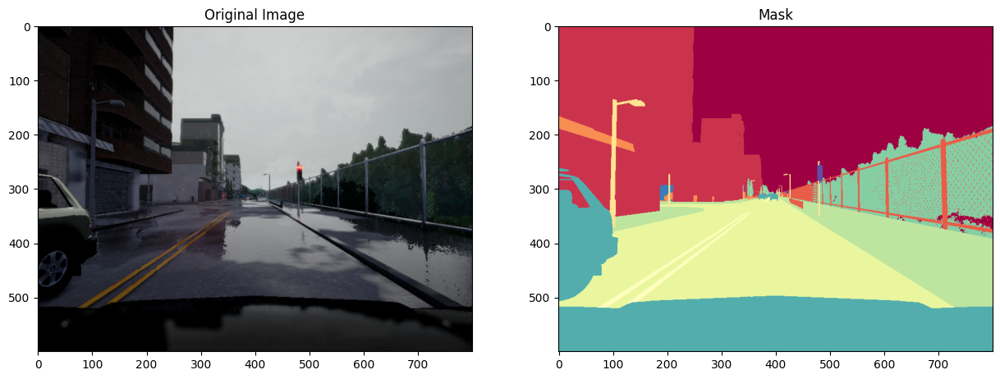

In [9]:
n = 2 # you can chose any index
img  = imageio.imread(train_image_list[n])
print(img.shape)
mask = imageio.imread(train_mask_list[n])
print(mask.shape)

mask = np.array([max(mask[i, j]) for i in range(mask.shape[0]) for j in range(mask.shape[1])]).reshape(img.shape[0], img.shape[1])

# now let's plot
fig ,arr  = plt.subplots(1,2,figsize=(15,10))
arr[0].imshow(img)
arr[0].set_title('Original Image')
arr[1].imshow(mask, cmap='Spectral')
arr[1].set_title('Mask')

In [10]:
train_image_list_dataset = tf.data.Dataset.list_files(train_image_list ,shuffle=False)
train_mask_list_dataset = tf.data.Dataset.list_files(train_mask_list , shuffle=False)
train_images_filenames = tf.constant(train_image_list)
train_masks_filenames = tf.constant(train_mask_list)

test_image_list_dataset = tf.data.Dataset.list_files(test_image_list ,shuffle=False)
test_mask_list_dataset = tf.data.Dataset.list_files(test_mask_list , shuffle=False)
test_images_filenames = tf.constant(test_image_list)
test_masks_filenames = tf.constant(test_mask_list)

train_dataset = tf.data.Dataset.from_tensor_slices((train_images_filenames, train_masks_filenames))
for image,mask in train_dataset.take(1) :
    print(image)
    print(mask)
test_dataset = tf.data.Dataset.from_tensor_slices((test_images_filenames, test_masks_filenames))
for image,mask in test_dataset.take(1) :
    print(image)
    print(mask)

In [14]:
def process_path(image_path,mask_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img,channels=3)
    #this do the same as dividing by 255 to set the values between 0 and 1 (normalization)
    img = tf.image.convert_image_dtype(img,tf.float32)

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask,channels=3)
    mask = tf.math.reduce_max(mask,axis=-1,keepdims=True)
    return img , mask

def preprocess(image,mask) :
    input_image = tf.image.resize(image,(96,128),method='nearest')
    input_mask = tf.image.resize(mask,(96,128),method='nearest')

    return input_image , input_mask

train_image_ds = train_dataset.map(process_path) # apply the preprocces_path function to our dataset
print(train_image_ds)
processed_train_image_ds = train_image_ds.map(preprocess) # apply the preprocess function to our dataset
test_image_ds = test_dataset.map(process_path) # apply the preprocces_path function to our dataset
processed_test_image_ds = test_image_ds.map(preprocess) # apply the preprocess function to our dataset

In [18]:
def conv_block(inputs=None, n_filters=32, dropout_prob=0, max_pooling=True):

    conv = Conv2D(n_filters,
                  kernel_size = 3,
                  activation='relu',
                  padding='same',
                  kernel_initializer=tf.keras.initializers.HeNormal())(inputs)
    conv = Conv2D(n_filters,
                  kernel_size = 3,
                  activation='relu',
                  padding='same',
                  kernel_initializer=tf.keras.initializers.HeNormal())(conv)

    if dropout_prob > 0:
        conv = Dropout(dropout_prob)(conv)

    if max_pooling:
        next_layer = MaxPooling2D(pool_size=(2,2))(conv)


    else:
        next_layer = conv

    skip_connection = conv

    return next_layer, skip_connection

def upsampling_block(expansive_input, contractive_input, n_filters=32):

    up = Conv2DTranspose(
                 n_filters,
                 kernel_size = 3,
                 strides=(2,2),
                 padding='same')(expansive_input)

    merge = concatenate([up, contractive_input], axis=3)
    conv = Conv2D(n_filters,
                 kernel_size = 3,
                 activation='relu',
                 padding='same',
                 kernel_initializer=tf.keras.initializers.HeNormal())(merge)
    conv = Conv2D(n_filters,
                 kernel_size = 3,
                 activation='relu',
                 padding='same',
                 kernel_initializer=tf.keras.initializers.HeNormal())(conv)


    return conv

def unet_model(input_size=(96, 128, 3), n_filters=32, n_classes=23):

    inputs = Input(input_size)

    #contracting path
    cblock1 = conv_block(inputs, n_filters)
    cblock2 = conv_block(cblock1[0], 2*n_filters)
    cblock3 = conv_block(cblock2[0], 4*n_filters)
    cblock4 = conv_block(cblock3[0], 8*n_filters, dropout_prob=0.3)
    cblock5 = conv_block(cblock4[0],16*n_filters, dropout_prob=0.3, max_pooling=None)

    #expanding path
    ublock6 = upsampling_block(cblock5[0], cblock4[1],  8 * n_filters)
    ublock7 = upsampling_block(ublock6, cblock3[1],  n_filters*4)
    ublock8 = upsampling_block(ublock7,cblock2[1] , n_filters*2)
    ublock9 = upsampling_block(ublock8,cblock1[1],  n_filters)

    conv9 = Conv2D(n_filters,
                 3,
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(ublock9)

    conv10 = Conv2D(n_classes, kernel_size=1, padding='same')(conv9)
    model = tf.keras.Model(inputs=inputs, outputs=conv10)

    return model

img_height = 96
img_width = 128
num_channels = 3

unet = unet_model((img_height, img_width, num_channels))
unet.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 96, 128,   │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 96, 128,   │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 96, 128,   │      9,248 │ conv2d[0][0]      │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 48, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 48, 64,    │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 48, 64,    │     36,928 │ conv2d_2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 24, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 24, 32,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 24, 32,    │    147,584 │ conv2d_4[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 12, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 12, 16,    │    295,168 │ max_pooling2d_2[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 12, 16,    │    590,080 │ conv2d_6[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 12, 16,    │          0 │ conv2d_7[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 6, 8, 256) │          0 │ dropout[0][0]     │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 6, 8, 512) │  1,180,160 │ max_pooling2d_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 6, 8, 512) │  2,359,808 │ conv2d_8[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 6, 8, 512) │          0 │ conv2d_9[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 12, 16,    │  1,179,904 │ dropout_1[0][0] 

 Total params: 8,640,471 (32.96 MB)

 Trainable params: 8,640,471 (32.96 MB)

 Non-trainable params: 0 (0.00 B)

In [21]:
NUM_CLASSES = 23
EPOCHS = 25
VAL_SUBSPLITS = 5
BUFFER_SIZE = 500
BATCH_SIZE = 16

@tf.keras.utils.register_keras_serializable()
class MeanIoUWrapper(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, name="mean_iou", **kwargs):
        super().__init__(num_classes=num_classes, name=name, **kwargs)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.argmax(y_pred, axis=-1)
        y_true = tf.squeeze(tf.cast(y_true, tf.int32), axis=-1)
        return super().update_state(y_true, y_pred, sample_weight)

miou_metric = MeanIoUWrapper(NUM_CLASSES)
unet.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy', miou_metric]
)

processed_train_image_ds.batch(BATCH_SIZE)
train_dataset = processed_train_image_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
print(processed_train_image_ds.element_spec)
model_history = unet.fit(train_dataset, epochs=EPOCHS)

(TensorSpec(shape=(96, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(96, 128, 1), dtype=tf.uint8, name=None))
Epoch 1/25
63/63 ━━━━━━━━━━━━━━━━━━━━ 65s 480ms/step - accuracy: 0.3421 - loss: 2.2086 - mean_iou: 0.0528
Epoch 2/25
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.7917 - loss: 0.6192 - mean_iou: 0.2872
Epoch 3/25
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.8446 - loss: 0.4852 - mean_iou: 0.3363
Epoch 4/25
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8809 - loss: 0.3796 - mean_iou: 0.3893
Epoch 5/25
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - accuracy: 0.8972 - loss: 0.3322 - mean_iou: 0.4254
Epoch 6/25
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - accuracy: 0.9145 - loss: 0.2740 - mean_iou: 0.4620
Epoch 7/25
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - accuracy: 0.9221 - loss: 0.2508 - mean_iou: 0.4814
Epoch 8/25
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - accuracy: 0.9265 - loss: 0.2346 - mean_iou: 0.4870
Epoch 9/25
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms

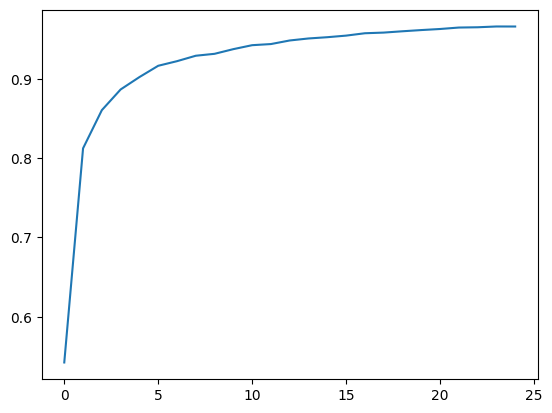

In [22]:
plt.plot(model_history.history["accuracy"])

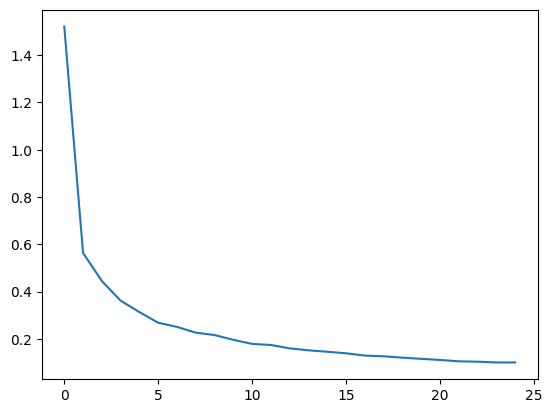

In [23]:
plt.plot(model_history.history["loss"])

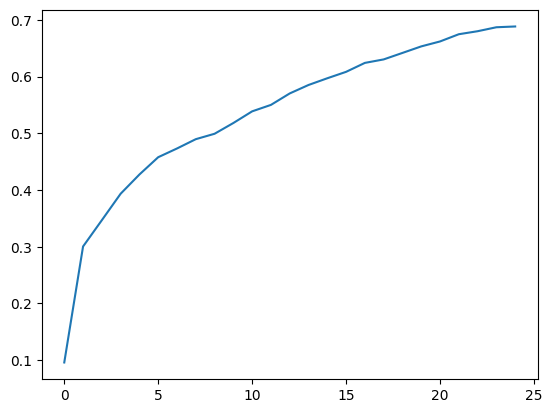

In [24]:
plt.plot(model_history.history["mean_iou"])

In [25]:
model_json = unet.to_json()
with open("unet_model.json", "w") as json_file:
    json_file.write(model_json)
unet.save_weights("model_30.weights.h5")

from tensorflow.keras.models import model_from_json
json_file = open('unet_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
#unet1 = model_from_json(loaded_model_json) #,
    #custom_objects={'Functional':tf.keras.models.Model, 'HeNormal':tf.keras.initializers.he_normal()})
unet1 = model_from_json(
    loaded_model_json,
    custom_objects={"MeanIoUWrapper": MeanIoUWrapper}
)
unet1.load_weights("model_30.weights.h5")

In [27]:
def display(display_list):
    global id
    plt.figure(figsize=(15, 5))
    plt.subplots_adjust(0,0,1,0.95,0.05, 0.05)

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i], size=15)
        img = np.squeeze(display_list[i]) #tf.keras.preprocessing.image.array_to_img(display_list[i])
        if i > 0:
          img = labels_to_cityscapes_palette(img).astype(np.uint8)
        plt.imshow(img)
        plt.axis('off')
    #plt.show()
    plt.suptitle('Semantic Segmentation with U-Net trained for 30 epochs', size=20)
    plt.savefig('images/00unet_seg_{:03d}_30.png'.format(id))
    plt.close()
    id += 1

def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

def labels_to_cityscapes_palette(image):
    """
    Convert an image containing CARLA semantic segmentation labels to
    Cityscapes palette.
    """
    classes = {
        0: [0, 0, 0],        # None
        1: [70, 70, 70],     # Buildings
        2: [190, 153, 153],  # Fences
        3: [72, 0, 90],      # Other
        4: [220, 20, 60],    # Pedestrians
        5: [153, 153, 153],  # Poles
        6: [157, 234, 50],   # RoadLines
        7: [128, 64, 128],   # Roads
        8: [244, 35, 232],   # Sidewalks
        9: [107, 142, 35],   # Vegetation
        10: [0, 0, 255],     # Vehicles
        11: [102, 102, 156], # Walls
        12: [220, 220, 0]    # TrafficSigns
    }
    array = np.asarray(image) #labels_to_array(image)
    result = np.zeros((array.shape[0], array.shape[1], 3))
    for key, value in classes.items():
        result[np.where(array == key)] = value
    return result

# https://arijitray1993.github.io/CARLA_tutorial/
def show_predictions(dataset=None, num=1):
    """
    Displays the first image of each of the num batches
    """
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = unet1.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
    else:
        display([sample_image, sample_mask,
             create_mask(unet1.predict(sample_image[tf.newaxis, ...]))])

processed_test_image_ds.batch(1)
test_dataset = processed_test_image_ds.cache().shuffle(BUFFER_SIZE).batch(1)
id = 1
show_predictions(test_dataset, 100)

In [ ]:
# ===============================
# MODEL EVALUATION
# ===============================
# ===============================
# IOU METRICS
# ===============================

def evaluate_model(model, dataset):
    metric = MeanIoUWrapper(NUM_CLASSES)

    for images, masks in dataset:
        logits = model(images, training=False)
        metric.update_state(masks, logits)

    print("\nMean IoU:", metric.result().numpy())
    return metric

processed_test_image_ds.batch(1)
test_dataset = processed_test_image_ds.cache().shuffle(BUFFER_SIZE).batch(1)
miou_metric_obj = evaluate_model(unet1, test_dataset)
miou_metric_obj

#### **7.2 U-Net with ResNet18 Backbone with `segmentation_models_pytorch`**

Epoch 1/25: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]



Epoch [1/25]
Loss        : 1.0909
Accuracy    : 0.1918
Mean IoU    : 0.1534
Mean Dice   : 6.0983



Epoch 2/25: 100%|██████████| 63/63 [00:34<00:00,  1.80it/s]



Epoch [2/25]
Loss        : 0.4355
Accuracy    : 0.4161
Mean IoU    : 0.3589
Mean Dice   : 6.8865



Epoch 3/25: 100%|██████████| 63/63 [00:33<00:00,  1.89it/s]



Epoch [3/25]
Loss        : 0.3435
Accuracy    : 0.4287
Mean IoU    : 0.3783
Mean Dice   : 6.9948



Epoch 4/25: 100%|██████████| 63/63 [00:33<00:00,  1.86it/s]



Epoch [4/25]
Loss        : 0.3069
Accuracy    : 0.4419
Mean IoU    : 0.3940
Mean Dice   : 7.0521



Epoch 5/25: 100%|██████████| 63/63 [00:33<00:00,  1.90it/s]



Epoch [5/25]
Loss        : 0.2833
Accuracy    : 0.4691
Mean IoU    : 0.4200
Mean Dice   : 7.0896



Epoch 6/25: 100%|██████████| 63/63 [00:33<00:00,  1.89it/s]



Epoch [6/25]
Loss        : 0.2569
Accuracy    : 0.5161
Mean IoU    : 0.4610
Mean Dice   : 7.1293



Epoch 7/25: 100%|██████████| 63/63 [00:33<00:00,  1.90it/s]



Epoch [7/25]
Loss        : 0.2476
Accuracy    : 0.5446
Mean IoU    : 0.4842
Mean Dice   : 7.1316



Epoch 8/25: 100%|██████████| 63/63 [00:33<00:00,  1.88it/s]



Epoch [8/25]
Loss        : 0.2247
Accuracy    : 0.5694
Mean IoU    : 0.5082
Mean Dice   : 7.1725



Epoch 9/25: 100%|██████████| 63/63 [00:32<00:00,  1.92it/s]



Epoch [9/25]
Loss        : 0.2110
Accuracy    : 0.5873
Mean IoU    : 0.5241
Mean Dice   : 7.1955



Epoch 10/25: 100%|██████████| 63/63 [00:34<00:00,  1.80it/s]



Epoch [10/25]
Loss        : 0.2001
Accuracy    : 0.5956
Mean IoU    : 0.5337
Mean Dice   : 7.2116



Epoch 11/25: 100%|██████████| 63/63 [00:37<00:00,  1.69it/s]



Epoch [11/25]
Loss        : 0.1941
Accuracy    : 0.6054
Mean IoU    : 0.5430
Mean Dice   : 7.2220



Epoch 12/25: 100%|██████████| 63/63 [00:34<00:00,  1.80it/s]



Epoch [12/25]
Loss        : 0.1904
Accuracy    : 0.6109
Mean IoU    : 0.5487
Mean Dice   : 7.2241



Epoch 13/25: 100%|██████████| 63/63 [00:35<00:00,  1.76it/s]



Epoch [13/25]
Loss        : 0.1795
Accuracy    : 0.6232
Mean IoU    : 0.5618
Mean Dice   : 7.2375



Epoch 14/25: 100%|██████████| 63/63 [00:35<00:00,  1.77it/s]



Epoch [14/25]
Loss        : 0.1709
Accuracy    : 0.6340
Mean IoU    : 0.5736
Mean Dice   : 7.2551



Epoch 15/25: 100%|██████████| 63/63 [00:33<00:00,  1.88it/s]



Epoch [15/25]
Loss        : 0.1651
Accuracy    : 0.6431
Mean IoU    : 0.5831
Mean Dice   : 7.2666



Epoch 16/25: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]



Epoch [16/25]
Loss        : 0.1649
Accuracy    : 0.6476
Mean IoU    : 0.5870
Mean Dice   : 7.2670



Epoch 17/25: 100%|██████████| 63/63 [00:34<00:00,  1.85it/s]



Epoch [17/25]
Loss        : 0.1577
Accuracy    : 0.6569
Mean IoU    : 0.5973
Mean Dice   : 7.2779



Epoch 18/25: 100%|██████████| 63/63 [00:35<00:00,  1.76it/s]



Epoch [18/25]
Loss        : 0.1551
Accuracy    : 0.6633
Mean IoU    : 0.6036
Mean Dice   : 7.2823



Epoch 19/25: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]



Epoch [19/25]
Loss        : 0.1495
Accuracy    : 0.6773
Mean IoU    : 0.6178
Mean Dice   : 7.2976



Epoch 20/25: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]



Epoch [20/25]
Loss        : 0.1452
Accuracy    : 0.6870
Mean IoU    : 0.6271
Mean Dice   : 7.3064



Epoch 21/25: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]



Epoch [21/25]
Loss        : 0.1426
Accuracy    : 0.6966
Mean IoU    : 0.6368
Mean Dice   : 7.3142



Epoch 22/25: 100%|██████████| 63/63 [00:33<00:00,  1.88it/s]



Epoch [22/25]
Loss        : 0.1397
Accuracy    : 0.7031
Mean IoU    : 0.6432
Mean Dice   : 7.3185



Epoch 23/25: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]



Epoch [23/25]
Loss        : 0.1378
Accuracy    : 0.7101
Mean IoU    : 0.6492
Mean Dice   : 7.3225



Epoch 24/25: 100%|██████████| 63/63 [00:33<00:00,  1.89it/s]



Epoch [24/25]
Loss        : 0.1321
Accuracy    : 0.7204
Mean IoU    : 0.6602
Mean Dice   : 7.3338



Epoch 25/25: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]



Epoch [25/25]
Loss        : 0.1315
Accuracy    : 0.7246
Mean IoU    : 0.6640
Mean Dice   : 7.3340



Evaluating: 100%|██████████| 63/63 [00:32<00:00,  1.95it/s]


========== FINAL TEST RESULTS ==========
Pixel Accuracy : 0.7356
Mean IoU       : 0.6700
Mean Dice      : 7.3376



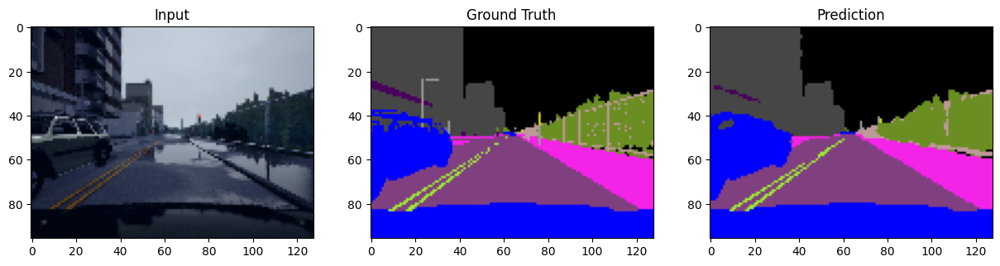

In [39]:
import os
import glob
import numpy as np
import imageio
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

import segmentation_models_pytorch as smp

from torchmetrics.classification import MulticlassAccuracy, MulticlassJaccardIndex
from torchmetrics.segmentation import DiceScore   # ✅ CORRECT IMPORT
import warnings
warnings.filterwarnings('ignore')  # Suppress all warnings

# ===============================
# CONFIG
# ===============================
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
NUM_CLASSES = 23
IMG_HEIGHT = 96
IMG_WIDTH = 128
BATCH_SIZE = 16
EPOCHS = 25
LR = 1e-3

# ===============================
# DATA PATHS
# ===============================
train_images = sorted(glob.glob("lyft-udacity-challenge/dataA/dataA/CameraRGB/*.png"))
train_masks  = sorted(glob.glob("lyft-udacity-challenge/dataA/dataA/CameraSeg/*.png"))

test_images = sorted(glob.glob("lyft-udacity-challenge/dataA/dataA/CameraRGB/*.png"))
test_masks  = sorted(glob.glob("lyft-udacity-challenge/dataA/dataA/CameraSeg/*.png"))

import os
import glob
import numpy as np
import imageio
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

import segmentation_models_pytorch as smp

from torchmetrics.classification import MulticlassAccuracy, MulticlassJaccardIndex
from torchmetrics.segmentation import DiceScore

# ===============================
# CONFIG
# ===============================
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
NUM_CLASSES = 23
IMG_HEIGHT = 96
IMG_WIDTH = 128
BATCH_SIZE = 16
EPOCHS = 25
LR = 1e-3

# ===============================
# DATA PATHS
# ===============================
train_images = sorted(glob.glob("lyft-udacity-challenge/dataA/dataA/CameraRGB/*.png"))
train_masks  = sorted(glob.glob("lyft-udacity-challenge/dataA/dataA/CameraSeg/*.png"))

test_images = sorted(glob.glob("lyft-udacity-challenge/dataA/dataA/CameraRGB/*.png"))
test_masks  = sorted(glob.glob("lyft-udacity-challenge/dataA/dataA/CameraSeg/*.png"))

# ===============================
# DATASET
# ===============================
class LyftDataset(Dataset):
    def __init__(self, image_paths, mask_paths):
        self.images = image_paths
        self.masks = mask_paths

        self.transform = A.Compose([
            A.Resize(IMG_HEIGHT, IMG_WIDTH),
            A.Normalize(),
            ToTensorV2()
        ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = imageio.imread(self.images[idx])
        mask = imageio.imread(self.masks[idx])

        mask = np.max(mask, axis=-1)

        augmented = self.transform(image=image, mask=mask)
        image = augmented["image"]
        mask = augmented["mask"].long()

        return image, mask


train_loader = DataLoader(
    LyftDataset(train_images, train_masks),
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    LyftDataset(test_images, test_masks),
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

# ===============================
# MODEL
# ===============================
model = smp.Unet(
    encoder_name="resnet18",
    encoder_weights=None,
    in_channels=3,
    classes=NUM_CLASSES
).to(DEVICE)

# ===============================
# LOSS & OPTIMIZER
# ===============================
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

# ===============================
# TRAIN METRICS (Epoch-wise)
# ===============================
train_acc_metric = MulticlassAccuracy(num_classes=NUM_CLASSES).to(DEVICE)
train_miou_metric = MulticlassJaccardIndex(num_classes=NUM_CLASSES, average="macro").to(DEVICE)
train_dice_metric = DiceScore(num_classes=NUM_CLASSES, average="macro").to(DEVICE)

# ===============================
# TRAINING LOOP
# ===============================
for epoch in range(EPOCHS):

    model.train()
    epoch_loss = 0.0

    # Reset metrics at start of epoch
    train_acc_metric.reset()
    train_miou_metric.reset()
    train_dice_metric.reset()

    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS}"):

        images = images.to(DEVICE)
        masks = masks.to(DEVICE)

        optimizer.zero_grad()
        outputs = model(images)

        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)

        train_acc_metric.update(preds, masks)
        train_miou_metric.update(preds, masks)
        train_dice_metric.update(preds, masks)

    # Compute epoch metrics
    epoch_loss /= len(train_loader)
    epoch_accuracy = train_acc_metric.compute().item()
    epoch_miou = train_miou_metric.compute().item()
    epoch_dice = train_dice_metric.compute().item()

    print("\n=======================================")
    print(f"Epoch [{epoch+1}/{EPOCHS}]")
    print(f"Loss        : {epoch_loss:.4f}")
    print(f"Accuracy    : {epoch_accuracy:.4f}")
    print(f"Mean IoU    : {epoch_miou:.4f}")
    print(f"Mean Dice   : {epoch_dice:.4f}")
    print("=======================================\n")

torch.save(model.state_dict(), "unet_smp.pth")

# ===============================
# FINAL EVALUATION
# ===============================
model.eval()

pixel_acc_metric = MulticlassAccuracy(num_classes=NUM_CLASSES).to(DEVICE)
miou_metric = MulticlassJaccardIndex(num_classes=NUM_CLASSES, average="macro").to(DEVICE)
dice_metric = DiceScore(num_classes=NUM_CLASSES, average="macro").to(DEVICE)

pixel_acc_metric.reset()
miou_metric.reset()
dice_metric.reset()

with torch.no_grad():
    for images, masks in tqdm(test_loader, desc="Evaluating"):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE)

        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        pixel_acc_metric.update(preds, masks)
        miou_metric.update(preds, masks)
        dice_metric.update(preds, masks)

print("\n========== FINAL TEST RESULTS ==========")
print(f"Pixel Accuracy : {pixel_acc_metric.compute().item():.4f}")
print(f"Mean IoU       : {miou_metric.compute().item():.4f}")
print(f"Mean Dice      : {dice_metric.compute().item():.4f}")
print("========================================\n")

# ===============================
# VISUALIZATION
# ===============================
def labels_to_cityscapes_palette(mask):
    classes = {
        0: [0, 0, 0],
        1: [70, 70, 70],
        2: [190, 153, 153],
        3: [72, 0, 90],
        4: [220, 20, 60],
        5: [153, 153, 153],
        6: [157, 234, 50],
        7: [128, 64, 128],
        8: [244, 35, 232],
        9: [107, 142, 35],
        10: [0, 0, 255],
        11: [102, 102, 156],
        12: [220, 220, 0],
    }
    h, w = mask.shape
    result = np.zeros((h, w, 3))
    for key, value in classes.items():
        result[mask == key] = value
    return result.astype(np.uint8)

model.eval()
with torch.no_grad():
    images, masks = next(iter(test_loader))
    images = images.to(DEVICE)

    outputs = model(images)
    preds = torch.argmax(outputs, dim=1)

image_np = images[0].cpu().permute(1,2,0).numpy()
true_mask = masks[0].cpu().numpy()
pred_mask = preds[0].cpu().numpy()

plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow((image_np - image_np.min())/(image_np.max()-image_np.min()))
plt.title("Input")

plt.subplot(1,3,2)
plt.imshow(labels_to_cityscapes_palette(true_mask))
plt.title("Ground Truth")

plt.subplot(1,3,3)
plt.imshow(labels_to_cityscapes_palette(pred_mask))
plt.title("Prediction")

plt.show()

### **8. Training UNet with `segmentation_models` to Segment Brain Tumor MRI iamges**

In [ ]:
# run in colab
import os
import kagglehub
os.environ["KAGGLEHUB_CACHE"] = "/content/"
# Download latest version
path = kagglehub.dataset_download("mateuszbuda/lgg-mri-segmentation")
print(path)

!mkdir /content/data/
!mkdir /content/data/lgg-mri-segmentation/
!mv /content/datasets/mateuszbuda/lgg-mri-segmentation/versions/2/kaggle_3m /content/data/lgg-mri-segmentation/

In [21]:
#!pip install segmentation-models tensorflow

import os, glob
import numpy as np
import tensorflow as tf
import keras
import matplotlib.pyplot as plt
from PIL import Image as PILImage

os.environ["SM_FRAMEWORK"] = "tf.keras"   # ← must be set before importing segmentation_models
import segmentation_models as sm

IMG_SIZE    = 256
BATCH_SIZE  = 16
NUM_CLASSES = 1
AUTOTUNE    = tf.data.AUTOTUNE
BACKBONE    = "resnet34"                  # pretrained ImageNet backbone

sm.set_framework("tf.keras")
sm.framework()

images = sorted(glob.glob("/content/data/lgg-mri-segmentation/kaggle_3m/**/*[!_mask].tif", recursive=True))
masks  = sorted(glob.glob("/content/data/lgg-mri-segmentation/kaggle_3m/**/*_mask.tif",    recursive=True))

print(f"Found {len(images)} images and {len(masks)} masks")

Segmentation Models: using `tf.keras` framework.
Found 3929 images and 3929 masks


In [22]:
# Preprocessing function matched to ResNet34 ImageNet stats
preprocess_input = sm.get_preprocessing(BACKBONE)

def load_tif(path, channels=3):
    mode = "RGB" if channels == 3 else "L"
    img  = PILImage.open(path).convert(mode).resize((IMG_SIZE, IMG_SIZE), PILImage.NEAREST)
    return np.array(img, dtype=np.float32)

def load_sample_np(img_path, mask_path):
    img_path  = img_path.decode("utf-8")
    mask_path = mask_path.decode("utf-8")

    # Image: apply backbone-specific preprocessing
    img  = load_tif(img_path, channels=3)                    # (H, W, 3) in [0, 255]
    img  = preprocess_input(img)                             # normalizes for ResNet34

    # Mask: binary float 0.0 or 1.0
    mask = load_tif(mask_path, channels=1)
    mask = (mask > 0).astype(np.float32)[..., np.newaxis]   # (H, W, 1)

    return img.astype(np.float32), mask

def tf_load_sample(img_path, mask_path):
    img, mask = tf.numpy_function(
        func = load_sample_np,
        inp  = [img_path, mask_path],
        Tout = [tf.float32, tf.float32],
    )
    img.set_shape ([IMG_SIZE, IMG_SIZE, 3])
    mask.set_shape([IMG_SIZE, IMG_SIZE, 1])
    return img, mask

# Train / val split 80/20
split   = int(len(images) * 0.8)
ds_full = tf.data.Dataset.from_tensor_slices((images, masks)).shuffle(1000, seed=42)

train_ds = (ds_full.take(split)
                   .map(tf_load_sample, num_parallel_calls=AUTOTUNE)
                   .batch(BATCH_SIZE)
                   .prefetch(AUTOTUNE))
val_ds   = (ds_full.skip(split)
                   .map(tf_load_sample, num_parallel_calls=AUTOTUNE)
                   .batch(BATCH_SIZE)
                   .prefetch(AUTOTUNE))

# Sanity check
imgs_test, masks_test = next(iter(train_ds))
print(f"Image shape : {imgs_test.shape}  range=[{imgs_test.numpy().min():.2f}, {imgs_test.numpy().max():.2f}]")
print(f"Mask  shape : {masks_test.shape} unique={np.unique(masks_test)}")
print(f"Train batches : {len(train_ds)} | Val batches : {len(val_ds)}")

Image shape : (16, 256, 256, 3)  range=[0.00, 253.00]
Mask  shape : (16, 256, 256, 1) unique=[0. 1.]
Train batches : 197 | Val batches : 50


In [23]:
model = sm.Unet(
    backbone_name     = BACKBONE,           # ResNet34 encoder
    encoder_weights   = "imagenet",         # pretrained weights
    input_shape       = (IMG_SIZE, IMG_SIZE, 3),
    classes           = NUM_CLASSES,        # 1 output channel
    activation        = "sigmoid",          # binary output
    encoder_freeze    = False,              # fine-tune entire network
)

model.summary()

85521592/85521592 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


Model: "functional_28"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ data (InputLayer)   │ (None, 256, 256,  │          0 │ -                 │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_data             │ (None, 256, 256,  │          9 │ data[0][0]        │
│ (BatchNormalizatio… │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 262, 262,  │          0 │ bn_data[0][0]     │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv0 (Conv2D)      │ (None, 128, 128,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn0                 │ (None, 128, 128,  │        256 │ conv0[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ relu0 (Activation)  │ (None, 128, 128,  │          0 │ bn0[0][0]         │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 130, 130,  │          0 │ relu0[0][0]       │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pooling0            │ (None, 64, 64,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_bn1    │ (None, 64, 64,    │        256 │ pooling0[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_relu1  │ (None, 64, 64,    │          0 │ stage1_unit1_bn1… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 66, 66,    │          0 │ stage1_unit1_rel… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_conv1  │ (None, 64, 64,    │     36,864 │ zero_padding2d_2… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_bn2    │ (None, 64, 64,    │        256 │ stage1_unit1_con… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_relu2  │ (None, 64, 64,    │          0 │ stage1_unit1_bn2… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 66, 66,    │          0 │ stage1_unit1_rel… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_conv2  │ (None, 64, 64,    │     36,864 │ zero_padding2d_3… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_sc     │ (None, 64, 64,    │      4,096 │ stage1_unit1_rel

 Total params: 24,456,154 (93.29 MB)

 Trainable params: 24,438,804 (93.23 MB)

 Non-trainable params: 17,350 (67.77 KB)

In [24]:
model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=1e-4),
    loss      = sm.losses.BinaryCELoss() + sm.losses.DiceLoss(),   # combined loss
    metrics   = [
        sm.metrics.IOUScore(threshold=0.5, name="iou"),
        sm.metrics.FScore(threshold=0.5,   name="f1"),             # Dice coefficient
    ],
)

callbacks = [
    keras.callbacks.ModelCheckpoint(
        "best_unet_brain.keras",
        save_best_only = True,
        monitor        = "val_iou",
        mode           = "max",
        verbose        = 1,
    ),
    keras.callbacks.ReduceLROnPlateau(
        monitor  = "val_loss",
        patience = 3,
        factor   = 0.5,
        min_lr   = 1e-7,
        verbose  = 1,
    ),
    keras.callbacks.EarlyStopping(
        monitor              = "val_iou",
        patience             = 7,
        mode                 = "max",
        restore_best_weights = True,
        verbose              = 1,
    ),
]

history = model.fit(
    train_ds,
    validation_data = val_ds,
    epochs          = 30,
    callbacks       = callbacks,
)

Epoch 1/30
197/197 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - f1: 0.2305 - iou: 0.1506 - loss: 1.5601
Epoch 1: val_iou improved from -inf to 0.28673, saving model to best_unet_brain.keras
197/197 ━━━━━━━━━━━━━━━━━━━━ 186s 577ms/step - f1: 0.2312 - iou: 0.1512 - loss: 1.5591 - val_f1: 0.4264 - val_iou: 0.2867 - val_loss: 1.2960 - learning_rate: 1.0000e-04
Epoch 2/30
197/197 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step - f1: 0.5639 - iou: 0.4126 - loss: 1.1487
Epoch 2: val_iou improved from 0.28673 to 0.39082, saving model to best_unet_brain.keras
197/197 ━━━━━━━━━━━━━━━━━━━━ 70s 357ms/step - f1: 0.5639 - iou: 0.4126 - loss: 1.1485 - val_f1: 0.5501 - val_iou: 0.3908 - val_loss: 1.0676 - learning_rate: 1.0000e-04
Epoch 3/30
197/197 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step - f1: 0.5807 - iou: 0.4286 - loss: 1.0192
Epoch 3: val_iou did not improve from 0.39082
197/197 ━━━━━━━━━━━━━━━━━━━━ 77s 330ms/step - f1: 0.5808 - iou: 0.4287 - loss: 1.0189 - val_f1: 0.3793 - val_iou: 0.2401 - val_loss: 0.9960 - learning_rat

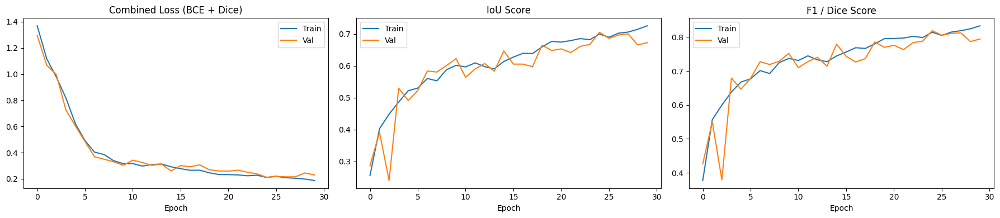

In [26]:
fig, axes = plt.subplots(1, 3, figsize=(18, 4))

axes[0].plot(history.history["loss"],     label="Train")
axes[0].plot(history.history["val_loss"], label="Val")
axes[0].set_title("Combined Loss (BCE + Dice)")
axes[0].legend(); axes[0].set_xlabel("Epoch")

axes[1].plot(history.history["iou"],      label="Train")
axes[1].plot(history.history["val_iou"],  label="Val")
axes[1].set_title("IoU Score")
axes[1].legend(); axes[1].set_xlabel("Epoch")

axes[2].plot(history.history["f1"],       label="Train")
axes[2].plot(history.history["val_f1"],   label="Val")
axes[2].set_title("F1 / Dice Score")
axes[2].legend(); axes[2].set_xlabel("Epoch")

plt.tight_layout()
plt.savefig("training_curves.png", dpi=150)
plt.show()

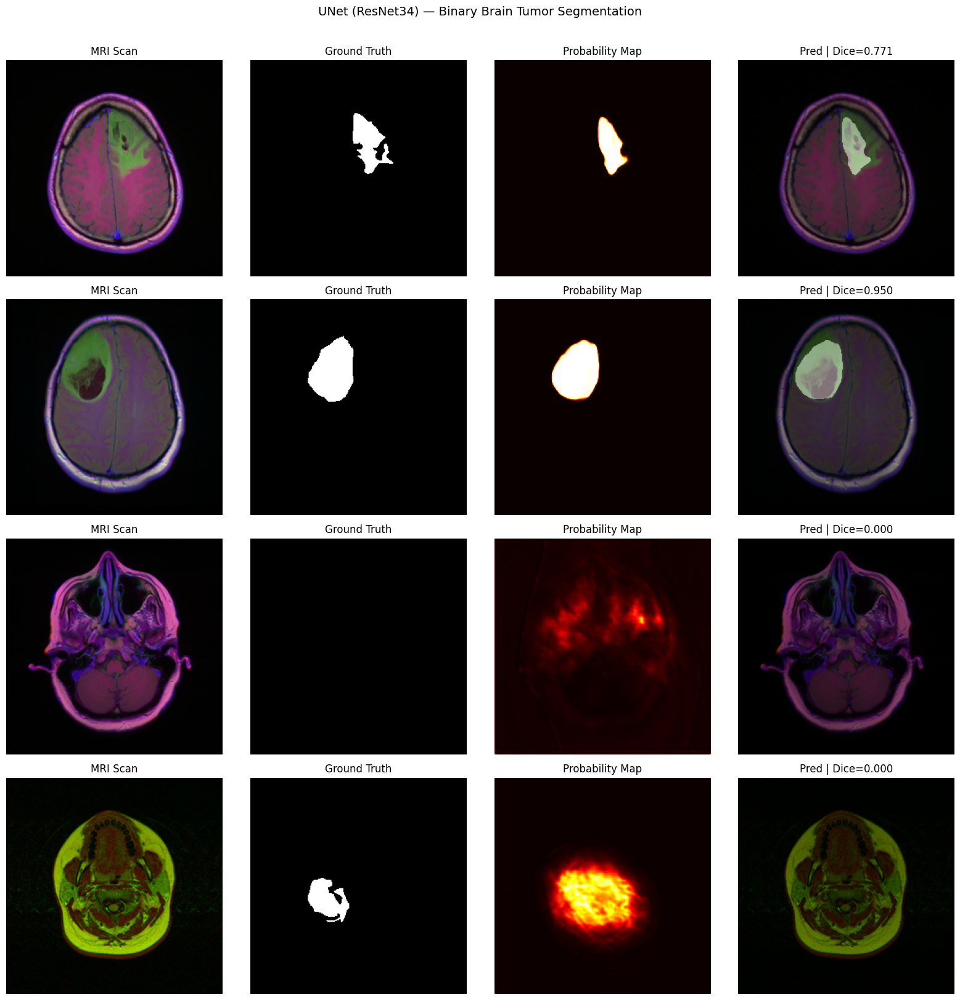

In [31]:
model.load_weights("best_unet_brain.keras")

imgs_batch, masks_batch = next(iter(val_ds))
preds     = model(imgs_batch, training=False)        # (B, H, W, 1) sigmoid probs
preds_bin = tf.cast(preds > 0.5, tf.float32)         # (B, H, W, 1) binary mask

def dice_score(pred, gt):
    pred  = tf.cast(pred > 0.5, tf.float32)
    inter = tf.reduce_sum(pred * gt)
    return (2.0 * inter / (tf.reduce_sum(pred) + tf.reduce_sum(gt) + 1e-8)).numpy()

fig, axes = plt.subplots(4, 4, figsize=(16, 16))
for i in range(4):
    dice     = dice_score(preds[i], masks_batch[i])
    prob_map = preds[i, :, :, 0].numpy()
    img = imgs_batch[i].numpy()
    img = img - img.min()
    img = img / img.max()
    mask = masks_batch[i,:,:,0].numpy()
    mask = mask - mask.min()
    #mask = mask / mask.max()
    overlay  = (
        img * 0.6 * 255 +
        np.stack([preds_bin[i, :, :, 0].numpy() * 255] * 3, axis=-1) * 0.4
    ).clip(0, 255).astype(np.uint8)

    axes[i,0].imshow(img);  axes[i,0].set_title("MRI Scan")
    axes[i,1].imshow(mask, cmap="gray");            axes[i,1].set_title("Ground Truth")
    axes[i,2].imshow(prob_map,             cmap="hot");             axes[i,2].set_title("Probability Map")
    axes[i,3].imshow(overlay);                                      axes[i,3].set_title(f"Pred | Dice={dice:.3f}")
    for ax in axes[i]: ax.axis("off")

plt.suptitle("UNet (ResNet34) — Binary Brain Tumor Segmentation", fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig("inference_output.png", dpi=150, bbox_inches="tight")
plt.show()

![](images/bmrs.gif)

### **9. 3D Segmentation of Liver CT images with Swin-UNETR**

In [ ]:
!pip install "monai[fire,nibabel,tqdm,einops]" torch matplotlib nibabel -q
!pip install connected-components-3d -q    # for 3D surface rendering
# ── Pretrained liver/organ segmentation bundle ────────────────────────────────
!python -m monai.bundle download "swin_unetr_btcv_segmentation" --bundle_dir bundles

In [ ]:
import os, glob, torch, numpy as np, nibabel as nib
import matplotlib.pyplot as plt, matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
from monai.networks.nets import SwinUNETR
from monai.transforms import (
    EnsureChannelFirst, Orientation, Spacing,
    ScaleIntensityRange, EnsureType, Compose
)
from monai.inferers import sliding_window_inference
import inspect

# ── Config ────────────────────────────────────────────────────────────────────
INPUT_DIR  = "Task03_Liver/imagesTr"
OUTPUT_DIR = "images"
os.makedirs(OUTPUT_DIR, exist_ok=True)

device     = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BUNDLE_DIR = "bundles/swin_unetr_btcv_segmentation"

LABELS = {0:"background",1:"spleen",2:"r.kidney",3:"l.kidney",4:"gallbladder",
          5:"esophagus",6:"liver",7:"stomach",8:"aorta",9:"inf.vena cava",
          10:"portal vein",11:"pancreas",12:"r.adrenal",13:"l.adrenal"}
COLORS = np.array([
    [0,  0,  0  ],[255,128,0  ],[255,0,  0  ],[0,  0,  255],[0,  255,0  ],
    [255,255,0  ],[210,105,30 ],[255,20, 147],[255,0,  255],[0,  255,255],
    [128,0,  128],[255,165,0  ],[0,  128,255],[255,69, 0  ]
], dtype=np.uint8)

# ── Load model once ───────────────────────────────────────────────────────────
sig         = inspect.signature(SwinUNETR.__init__)
base_kwargs = dict(in_channels=1, out_channels=14, feature_size=48, use_checkpoint=False)
if "img_size" in sig.parameters:
    base_kwargs["img_size"] = (96, 96, 96)

model = SwinUNETR(**base_kwargs).to(device)
ckpt  = torch.load(f"{BUNDLE_DIR}/models/model.pt", map_location=device)
model.load_state_dict({k.replace("module.",""): v for k,v in ckpt.items()}, strict=False)
model.eval()
print("Model loaded")

# ── Preprocessing + inference ─────────────────────────────────────────────────
preprocess = Compose([
    EnsureChannelFirst(channel_dim="no_channel"),
    Orientation(axcodes="RAS"),
    Spacing(pixdim=(1.5,1.5,2.0), mode="bilinear"),
    ScaleIntensityRange(a_min=-175, a_max=250, b_min=0., b_max=1., clip=True),
    EnsureType(),
])

def pad32(t):
    s = torch.tensor(t.shape[1:])
    p = ((32 - s % 32) % 32)
    return torch.nn.functional.pad(t,[0,int(p[2]),0,int(p[1]),0,int(p[0])]), tuple(s.tolist())

def run_inference(ct_path):
    nii    = nib.load(ct_path)
    img_t  = preprocess(nii.get_fdata().astype(np.float32))
    img_padded, orig_shape = pad32(img_t)
    with torch.no_grad():
        pred = sliding_window_inference(
            img_padded.unsqueeze(0).to(device),
            roi_size=(96,96,96), sw_batch_size=2, predictor=model, overlap=0.5
        )
    H,W,D = orig_shape
    seg = torch.softmax(pred,1).argmax(1).squeeze()[:H,:W,:D].cpu().numpy()
    return img_t.squeeze().cpu().numpy(), seg

# ── Visualization helpers ──────────────────────────────────────────────────────
def norm(x):     return (x-x.min())/(x.max()-x.min()+1e-8)
def colorize(s): return COLORS[np.clip(s, 0, len(COLORS)-1)]
def overlay(i,s,a=0.55):
    rgb=np.stack([norm(i)]*3,-1); col=colorize(s)/255.; out=rgb.copy()
    out[s>0]=rgb[s>0]*(1-a)+col[s>0]*a
    return (out*255).clip(0,255).astype(np.uint8)
def spotlight(i,s):
    base=np.stack([norm(i)]*3,-1); out=base*0.12
    mask=(s==6); out[mask]=base[mask]*0.25+np.array([0.82,0.41,0.12])*0.75
    return (out*255).clip(0,255).astype(np.uint8)

def plot_and_save(img, seg, ct_path):
    fname = os.path.basename(ct_path).replace(".nii.gz","").replace(".nii","")
    cz    = int(np.where(seg==6)[2].mean()) if np.any(seg==6) else seg.shape[2]//2
    im, sg = norm(img[:,:,cz]).T, seg[:,:,cz].T

    panels = [("CT Scan",        im,              "bone"),
              ("Segmentation",   colorize(sg),    None  ),
              ("Overlay",        overlay(im,sg),  None  ),
              ("Liver Spotlight",spotlight(im,sg),None  )]

    fig, axes = plt.subplots(1, 4, figsize=(22, 6),
                             gridspec_kw={"wspace":0.04},
                             facecolor="#0d0d0d")
    fig.suptitle(f"MONAI -> Swin-UNETR -> Axial Segmentation  ->  {fname}",
                 color="white", fontsize=13, fontweight="bold", y=1.01)

    for ax,(title,data,cmap) in zip(axes, panels):
        ax.imshow(data, cmap=cmap, origin="lower")
        ax.set_title(title, color="white", fontsize=10, pad=5)
        ax.set_facecolor("#0d0d0d"); ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values(): sp.set_edgecolor("#333")

    detected = [i for i in np.unique(seg) if i > 0]
    patches  = [mpatches.Patch(color=COLORS[i]/255., label=LABELS[i].title())
                for i in detected]
    fig.legend(handles=patches, loc="lower center", ncol=len(patches),
               fontsize=8, frameon=True, facecolor="#1a1a1a",
               edgecolor="#444", labelcolor="white",
               bbox_to_anchor=(0.5, -0.08))

    out_path = os.path.join(OUTPUT_DIR, f"{fname}_axial.png")
    plt.savefig(out_path, dpi=150, bbox_inches="tight", facecolor="#0d0d0d")
    plt.close(fig)
    print(f"Saved:  {out_path}")

# ── Main loop ─────────────────────────────────────────────────────────────────
ct_files = sorted(glob.glob(os.path.join(INPUT_DIR,"**/*.nii*"), recursive=True))
print(f"Found {len(ct_files)} CT files\n{'='*45}")

ct_path = os.path.join(INPUT_DIR,"liver_3.nii.gz")
print(f"{os.path.basename(ct_path)}")
try:
    img, seg = run_inference(ct_path)
    print(f"organs: {[LABELS[i] for i in np.unique(seg) if i>0]}")
    plot_and_save(img, seg, ct_path)
except Exception as e:
    print(f"Failed: {e}")

print(f"\n Done - outputs in {OUTPUT_DIR}")

![](images/liver_3_axial.png)

In [ ]:
import numpy as np

LABELS = {0:"background",1:"spleen",2:"r.kidney",3:"l.kidney",4:"gallbladder",
          5:"esophagus",6:"liver",7:"stomach",8:"aorta",9:"inf.vena cava",
          10:"portal vein",11:"pancreas",12:"r.adrenal",13:"l.adrenal"}

COLORS = np.array([
    [0,0,0],[255,128,0],[255,0,0],[0,0,255],[0,255,0],
    [255,255,0],[210,105,30],[255,20,147],[255,0,255],[0,255,255],
    [128,0,128],[255,165,0],[0,128,255],[255,69,0]
], dtype=np.uint8)/255.0

#### **3D Visualization with `vedo`**

In [ ]:
from vedo import Volume, Mesh, LegendBox, Plotter
from skimage import measure

# --- create organ meshes ---
meshes = []

for label, name in LABELS.items():

    if label == 0:
        continue

    mask = seg == label
    if mask.sum() == 0:
        continue

    verts, faces, _, _ = measure.marching_cubes(mask, 0)

    mesh = Mesh([verts, faces])
    mesh.c(COLORS[label]).alpha(0.7)
    mesh.name = name

    meshes.append(mesh)

legend = LegendBox(meshes)

# --- CT volume ---
ct_vol = Volume(img)
ct_vol.cmap("bone")
ct_vol.alpha([0,0.1,0.2,0.4,0.8])

# --- create 2-panel viewer ---
plt = Plotter(N=2, axes=9, bg="black", size=(1600,800))

plt.show(ct_vol, at=0)           # left panel (CT)
plt.show(meshes, at=1)  # right panel (segmentation)
#plt.interactive().close()

![](images/vedo_seg_liver.png)

#### **3D Visualization with `vtk`**

In [ ]:
import vtk
import numpy as np
import imageio
from vtk.util import numpy_support
from skimage import measure

# -----------------------------
# Renderers
# -----------------------------

renderer1 = vtk.vtkRenderer()
renderer2 = vtk.vtkRenderer()

renderer1.SetViewport(0,0.15,0.5,1)
renderer2.SetViewport(0.5,0.15,1,1)

renderer1.SetBackground(0,0,0)
renderer2.SetBackground(0,0,0)

# -----------------------------
# CT volume
# -----------------------------

data = numpy_support.numpy_to_vtk(img.ravel(order="F"), deep=True)

ct = vtk.vtkImageData()
ct.SetDimensions(img.shape)
ct.GetPointData().SetScalars(data)

mapper = vtk.vtkSmartVolumeMapper()
mapper.SetInputData(ct)

color = vtk.vtkColorTransferFunction()
color.AddRGBPoint(-1000,0,0,0)
color.AddRGBPoint(-300,0.7,0.7,0.7)
color.AddRGBPoint(40,1.0,0.8,0.7)
color.AddRGBPoint(400,1,1,1)

opacity = vtk.vtkPiecewiseFunction()
opacity.AddPoint(-1000,0)
opacity.AddPoint(-300,0)
opacity.AddPoint(40,0.15)
opacity.AddPoint(200,0.3)
opacity.AddPoint(1000,0.85)

volumeProperty = vtk.vtkVolumeProperty()
volumeProperty.SetColor(color)
volumeProperty.SetScalarOpacity(opacity)
volumeProperty.ShadeOn()
volumeProperty.SetInterpolationTypeToLinear()

volume = vtk.vtkVolume()
volume.SetMapper(mapper)
volume.SetProperty(volumeProperty)

renderer1.AddVolume(volume)

# -----------------------------
# segmentation meshes
# -----------------------------

actors = []

for label, name in LABELS.items():

    if label == 0:
        continue

    mask = seg == label
    if mask.sum() == 0:
        continue

    verts, faces, _, _ = measure.marching_cubes(mask,0)

    points = vtk.vtkPoints()
    for v in verts:
        points.InsertNextPoint(v)

    triangles = vtk.vtkCellArray()

    for f in faces:
        tri = vtk.vtkTriangle()
        tri.GetPointIds().SetId(0,f[0])
        tri.GetPointIds().SetId(1,f[1])
        tri.GetPointIds().SetId(2,f[2])
        triangles.InsertNextCell(tri)

    poly = vtk.vtkPolyData()
    poly.SetPoints(points)
    poly.SetPolys(triangles)

    mapper = vtk.vtkPolyDataMapper()
    mapper.SetInputData(poly)

    actor = vtk.vtkActor()
    actor.SetMapper(mapper)
    actor.GetProperty().SetColor(*COLORS[label])
    actor.GetProperty().SetOpacity(0.8)

    renderer2.AddActor(actor)
    actors.append(actor)

renderer1.ResetCamera()
renderer2.ResetCamera()

# -----------------------------
# Shared camera
# -----------------------------

camera = renderer1.GetActiveCamera()
renderer2.SetActiveCamera(camera)

# -----------------------------
# Title
# -----------------------------

title = vtk.vtkTextActor()
title.SetInput("3D CT Volume and Organ Segmentation")

titleprop = title.GetTextProperty()
titleprop.SetFontSize(36)
titleprop.BoldOn()
titleprop.SetColor(1,1,1)

title.SetPosition(350,550)

# -----------------------------
# Segmentation legend (bottom)
# -----------------------------

legend = vtk.vtkLegendBoxActor()
legend.SetNumberOfEntries(len(LABELS)-1)

textProp = vtk.vtkTextProperty()
textProp.SetFontSize(32)
textProp.SetColor(1,1,1)
textProp.BoldOn()
legend.SetEntryTextProperty(textProp)

entry = 0

for label, name in LABELS.items():

    if label == 0:
        continue

    cube = vtk.vtkCubeSource()
    cube.Update()

    legend.SetEntry(entry, cube.GetOutput(), name, COLORS[label])
    entry += 1

legend.GetPositionCoordinate().SetCoordinateSystemToNormalizedViewport()
legend.GetPositionCoordinate().SetValue(0.25,0.02)
legend.GetPosition2Coordinate().SetValue(0.5,0.1)

legend.UseBackgroundOn()
legend.SetBackgroundColor(0,0,0)
legend.SetBackgroundOpacity(0.6)

# -----------------------------
# Render window
# -----------------------------

window = vtk.vtkRenderWindow()
window.SetSize(1200,600)
window.AddRenderer(renderer1)
window.AddRenderer(renderer2)

renderer1.AddActor2D(title)
renderer2.AddActor2D(legend)

window.Render()

# -----------------------------
# Capture frames
# -----------------------------

w2if = vtk.vtkWindowToImageFilter()
w2if.SetInput(window)
w2if.SetScale(1)
w2if.SetInputBufferTypeToRGB()
w2if.ReadFrontBufferOff()

frames = []

for i in range(180):

    camera.Azimuth(2)
    window.Render()

    w2if.Modified()
    w2if.Update()

    vtk_image = w2if.GetOutput()

    width, height, _ = vtk_image.GetDimensions()

    vtk_array = vtk_image.GetPointData().GetScalars()
    arr = numpy_support.vtk_to_numpy(vtk_array)

    arr = arr.reshape(height, width, 3)
    arr = np.flipud(arr)

    frames.append(arr)

# -----------------------------
# Save GIF
# -----------------------------

imageio.mimsave("ct_segmentation_rotation.gif", frames, duration=0.05)

print("GIF saved as ct_segmentation_rotation.gif")

![](images/vtk_seg_liver.png)
![](images/vtk_seg_liver.gif)

### **10. Segmentation Evaluation Metrics**

For ground truth (Y) and prediction (\hat{Y}):

#### **10.1 Intersection over Union (IoU)**

$$IoU = \frac{|Y \cap \hat{Y}|}{|Y \cup \hat{Y}|}$$

#### **10.2 Dice Coefficient**

$$Dice = \frac{2|Y \cap \hat{Y}|}{|Y| + |\hat{Y}|}$$

#### **10.3 Pixel Accuracy**

$$Accuracy = \frac{\text{correct pixels}}{\text{total pixels}}$$

#### **10.4 Mean Average Precision (mAP) (Instance)**

Used for Mask R-CNN evaluation.

## **Conclusion**

This chapter provides a complete progression:

| Classical          | Deep Learning     |
| ------------------ | ----------------- |
| Thresholding       | FCN               |
| Morphology         | DeepLab           |
| Variational models | UNet              |
| Graph cuts         | Mask R-CNN        |
| CRF                | Transformers      |
| Mumford–Shah       | Foundation models |

Understanding classical segmentation builds the theoretical intuition necessary to appreciate deep learning architectures. Meanwhile, deep models dramatically expand segmentation capabilities across domains.

Together, these approaches equip the reader with:

* Mathematical insight
* Algorithmic intuition
* Practical Python implementations
* State-of-the-art pretrained systems
* Custom model training capability

## Further reading

1. http://scikit-image.org/docs/dev/user_guide/tutorial_segmentation.html
2. https://www.scipy-lectures.org/packages/scikit-image/index.html
3. http://scikit-image.org/docs/dev/auto_examples/
4. https://web.stanford.edu/class/ee368/Handouts/Lectures/2014_Spring/Combined_Slides/6-Image-Segmentation-Combined.pdf
5. https://courses.csail.mit.edu/6.869/lectnotes/lect19/lect19-slides-6up.pdf
6. http://cmm.ensmp.fr/~beucher/publi/WTS_residues.pdf
7. http://cmm.ensmp.fr/~beucher/wtshed.html
8. https://sandipanweb.wordpress.com/2018/02/25/graph-based-imagesegmentation-in-python/
9. https://sandipanweb.wordpress.com/2018/02/11/interactive-imagesegmentation-with-graph-cut/
10. http://people.cs.uchicago.edu/~pff/papers/seg-ijcv.pdf
11. http://www.kev-smith.com/papers/SMITH_TPAMI12.pdf
12. https://youtu.be/RL4VxB-Vjhs